# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

In [1]:
data_dir = './data'

import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST


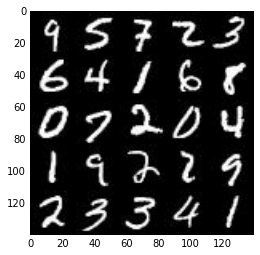

In [2]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
一个包含 20 多万张名人图片及相关图片说明的数据集

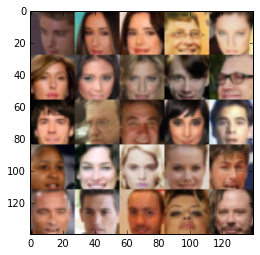

In [3]:
show_n_images = 25

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）


## 建立神经网络（Build the Neural Network）


### 检查 TensorFlow 版本并获取 GPU 型号

In [4]:

from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.4.1
Default GPU Device: /device:GPU:0


### 输入（Input）

In [5]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_real = tf.placeholder(tf.float32,[None, image_width, image_height, image_channels])
    input_z = tf.placeholder(tf.float32, [None, z_dim])
    learning_rate = tf.placeholder(tf.float32)
    return input_real, input_z, learning_rate


### 辨别器（Discriminator）

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha = 0.1
        dropout = 0.6
        
        #28*28*3  
        x1 = tf.layers.conv2d(images, 64, 5, strides=2 ,padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(alpha * x1, x1)
        drop1 = tf.nn.dropout(relu1, dropout)
        #14*14*64
        
        x2 = tf.layers.conv2d(drop1, 128, 5, strides=2 ,padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        drop2 = tf.nn.dropout(relu2, dropout)
        #7*7*128
        
        x3 = tf.layers.conv2d(drop2, 256, 5, strides=2 ,padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)      
        drop3 = tf.nn.dropout(relu3, dropout)
        #4*4*256
        
#         x4 = tf.layers.conv2d(drop3, 512, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
#         bn4 = tf.layers.batch_normalization(x4, training=True)
#         relu4 = tf.maximum(alpha * bn4, bn4)
#         drop4 = tf.nn.dropout(relu4, dropout)
        #4*4*512
        
        flat = tf.reshape(drop3, [-1, 4*4*256])
        logits = tf.layers.dense(flat, 1, kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.nn.sigmoid(logits)
        return out, logits



### 生成器（Generator）

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        alpha = 0.1
        dropout = 0.6
        
        #fully connected and reshape
        x1 = tf.layers.dense(z, 7*7*256, kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.nn.relu(x1)
        x1 = tf.reshape(x1, [-1, 7, 7, 256])
        x1 = tf.nn.dropout(x1, dropout)
        #7*7*256
        
        x2 = tf.image.resize_nearest_neighbor(x1, (14, 14))
        x2 = tf.layers.conv2d_transpose(x2, 128, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.nn.relu(x2)
        #n14*14*128
        
        x3 = tf.image.resize_nearest_neighbor(x2, (28, 28))
        x3 = tf.layers.conv2d_transpose(x3, 64, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.nn.relu(x3)
        #28*28*64
        
#         x4 = tf.layers.conv2d_transpose(x3, 32, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
#         x4 = tf.layers.batch_normalization(x4, training=is_train)
#         x4 = tf.nn.relu(x4)
        #28*28*32
        
        #output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.nn.tanh(logits)
        return out

### 损失函数（Loss）

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

### 优化（Optimization）

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
  
    return d_train_opt, g_train_opt

## 训练神经网络（Neural Network Training）
### 输出显示

In [10]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # Build Model
    input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    global_step = tf.Variable(0, trainable=False)
    d_train_opt, _ = model_opt(d_loss, g_loss, learning_rate, beta1)
    _, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    saver = tf.train.Saver()
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # Train Model
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=[batch_size, z_dim])
                batch_images = batch_images * 2
                #Run optimizers
                sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                
                if(steps % 10 == 0):
                    #Get and print losses
                    train_loss_d = sess.run(d_loss, feed_dict={input_real: batch_images, input_z: batch_z})
                    train_loss_g = sess.run(g_loss, feed_dict={input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                         "Discriminator loss: {:.4f}".format(train_loss_d),
                         "Generator loss: {:.4f}".format(train_loss_g))
                if(steps % 100 == 0):
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                

### MNIST


Epoch 1/2... Discriminator loss: 2.8575 Generator loss: 0.3803
Epoch 1/2... Discriminator loss: 1.8820 Generator loss: 0.4897
Epoch 1/2... Discriminator loss: 1.6382 Generator loss: 0.9840
Epoch 1/2... Discriminator loss: 1.7046 Generator loss: 1.7202
Epoch 1/2... Discriminator loss: 1.4172 Generator loss: 1.1603
Epoch 1/2... Discriminator loss: 1.5215 Generator loss: 0.5884
Epoch 1/2... Discriminator loss: 1.6566 Generator loss: 1.7093
Epoch 1/2... Discriminator loss: 1.7231 Generator loss: 0.5429
Epoch 1/2... Discriminator loss: 1.3663 Generator loss: 0.9270
Epoch 1/2... Discriminator loss: 1.5202 Generator loss: 0.9909


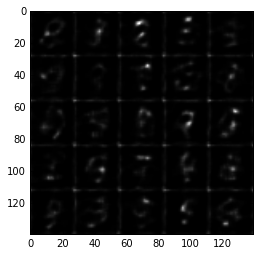

Epoch 1/2... Discriminator loss: 1.9372 Generator loss: 0.8147
Epoch 1/2... Discriminator loss: 1.7845 Generator loss: 0.8297
Epoch 1/2... Discriminator loss: 1.5695 Generator loss: 0.7860
Epoch 1/2... Discriminator loss: 1.5999 Generator loss: 1.2267
Epoch 1/2... Discriminator loss: 1.4556 Generator loss: 0.6844
Epoch 1/2... Discriminator loss: 1.3629 Generator loss: 0.6988
Epoch 1/2... Discriminator loss: 1.4229 Generator loss: 1.0573
Epoch 1/2... Discriminator loss: 1.5136 Generator loss: 0.8333
Epoch 1/2... Discriminator loss: 1.4797 Generator loss: 0.6836
Epoch 1/2... Discriminator loss: 1.2964 Generator loss: 0.8256


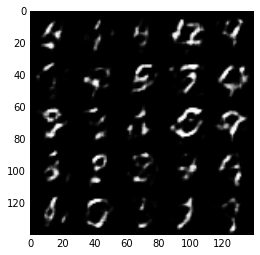

Epoch 1/2... Discriminator loss: 1.4833 Generator loss: 0.9223
Epoch 1/2... Discriminator loss: 1.4532 Generator loss: 0.8721
Epoch 1/2... Discriminator loss: 1.3310 Generator loss: 0.7682
Epoch 1/2... Discriminator loss: 1.4161 Generator loss: 0.7760
Epoch 1/2... Discriminator loss: 1.4465 Generator loss: 0.7826
Epoch 1/2... Discriminator loss: 1.5172 Generator loss: 1.1902
Epoch 1/2... Discriminator loss: 1.4410 Generator loss: 0.9387
Epoch 1/2... Discriminator loss: 1.4271 Generator loss: 0.7024
Epoch 1/2... Discriminator loss: 1.1976 Generator loss: 0.8432
Epoch 1/2... Discriminator loss: 1.4283 Generator loss: 0.7610


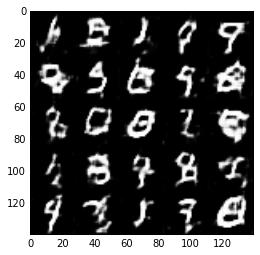

Epoch 1/2... Discriminator loss: 1.3981 Generator loss: 1.0188
Epoch 1/2... Discriminator loss: 1.3584 Generator loss: 0.8356
Epoch 1/2... Discriminator loss: 1.3247 Generator loss: 0.5555
Epoch 1/2... Discriminator loss: 1.4692 Generator loss: 0.8838
Epoch 1/2... Discriminator loss: 1.3120 Generator loss: 0.8420
Epoch 1/2... Discriminator loss: 1.3983 Generator loss: 0.7466
Epoch 1/2... Discriminator loss: 1.4842 Generator loss: 0.8547
Epoch 1/2... Discriminator loss: 1.3799 Generator loss: 0.8245
Epoch 1/2... Discriminator loss: 1.3939 Generator loss: 0.8313
Epoch 1/2... Discriminator loss: 1.2576 Generator loss: 0.8166


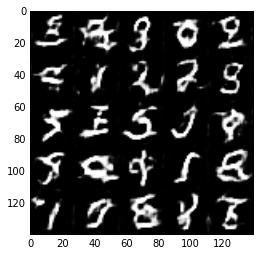

Epoch 1/2... Discriminator loss: 1.5380 Generator loss: 1.1304
Epoch 1/2... Discriminator loss: 1.2793 Generator loss: 1.0271
Epoch 1/2... Discriminator loss: 1.2687 Generator loss: 0.6888
Epoch 1/2... Discriminator loss: 1.3214 Generator loss: 1.2448
Epoch 1/2... Discriminator loss: 1.3633 Generator loss: 1.0070
Epoch 1/2... Discriminator loss: 1.4494 Generator loss: 0.7961
Epoch 1/2... Discriminator loss: 1.2588 Generator loss: 0.9657
Epoch 1/2... Discriminator loss: 1.4210 Generator loss: 0.7520
Epoch 1/2... Discriminator loss: 1.4127 Generator loss: 0.8766
Epoch 1/2... Discriminator loss: 1.2971 Generator loss: 1.0356


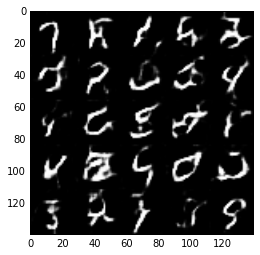

Epoch 1/2... Discriminator loss: 1.3878 Generator loss: 0.9700
Epoch 1/2... Discriminator loss: 1.4913 Generator loss: 0.6002
Epoch 1/2... Discriminator loss: 1.2577 Generator loss: 1.1352
Epoch 1/2... Discriminator loss: 1.1719 Generator loss: 1.1981
Epoch 1/2... Discriminator loss: 1.2817 Generator loss: 0.8664
Epoch 1/2... Discriminator loss: 1.2161 Generator loss: 1.0958
Epoch 1/2... Discriminator loss: 1.3590 Generator loss: 0.8958
Epoch 1/2... Discriminator loss: 1.3419 Generator loss: 0.8856
Epoch 1/2... Discriminator loss: 1.3980 Generator loss: 0.9084
Epoch 1/2... Discriminator loss: 1.2033 Generator loss: 0.9308


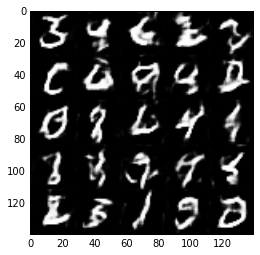

Epoch 1/2... Discriminator loss: 1.2544 Generator loss: 0.8807
Epoch 1/2... Discriminator loss: 1.2295 Generator loss: 0.9424
Epoch 1/2... Discriminator loss: 1.3128 Generator loss: 0.7784
Epoch 1/2... Discriminator loss: 1.2893 Generator loss: 0.7288
Epoch 1/2... Discriminator loss: 1.3573 Generator loss: 0.8446
Epoch 1/2... Discriminator loss: 1.3209 Generator loss: 0.7502
Epoch 1/2... Discriminator loss: 1.2122 Generator loss: 1.2904
Epoch 1/2... Discriminator loss: 1.4101 Generator loss: 1.0101
Epoch 1/2... Discriminator loss: 1.2072 Generator loss: 1.1554
Epoch 1/2... Discriminator loss: 1.3133 Generator loss: 1.0247


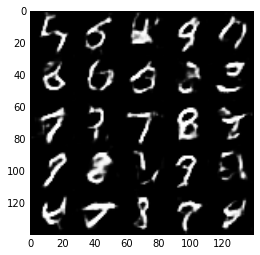

Epoch 1/2... Discriminator loss: 1.3225 Generator loss: 0.9340
Epoch 1/2... Discriminator loss: 1.4364 Generator loss: 0.6398
Epoch 1/2... Discriminator loss: 1.4705 Generator loss: 0.8543
Epoch 1/2... Discriminator loss: 1.4281 Generator loss: 1.0176
Epoch 1/2... Discriminator loss: 1.2323 Generator loss: 0.9156
Epoch 1/2... Discriminator loss: 1.5523 Generator loss: 0.5693
Epoch 1/2... Discriminator loss: 1.3307 Generator loss: 1.1155
Epoch 1/2... Discriminator loss: 1.3269 Generator loss: 0.9157
Epoch 1/2... Discriminator loss: 1.3333 Generator loss: 0.5925
Epoch 1/2... Discriminator loss: 1.3455 Generator loss: 0.9299


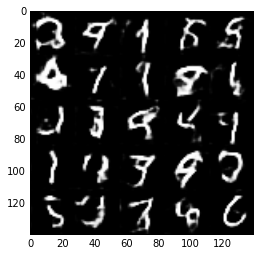

Epoch 1/2... Discriminator loss: 1.5124 Generator loss: 1.0786
Epoch 1/2... Discriminator loss: 1.2417 Generator loss: 0.8207
Epoch 1/2... Discriminator loss: 1.1032 Generator loss: 0.7767
Epoch 1/2... Discriminator loss: 1.2704 Generator loss: 0.7432
Epoch 1/2... Discriminator loss: 1.1882 Generator loss: 0.8980
Epoch 1/2... Discriminator loss: 1.2622 Generator loss: 1.1710
Epoch 1/2... Discriminator loss: 1.1922 Generator loss: 1.2341
Epoch 1/2... Discriminator loss: 1.1255 Generator loss: 0.8893
Epoch 1/2... Discriminator loss: 1.2914 Generator loss: 1.1955
Epoch 1/2... Discriminator loss: 1.1759 Generator loss: 0.9779


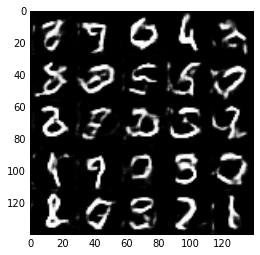

Epoch 1/2... Discriminator loss: 1.0913 Generator loss: 1.0213
Epoch 1/2... Discriminator loss: 1.2383 Generator loss: 0.8861
Epoch 1/2... Discriminator loss: 1.2176 Generator loss: 1.1442
Epoch 1/2... Discriminator loss: 1.2454 Generator loss: 0.9856
Epoch 1/2... Discriminator loss: 1.3937 Generator loss: 0.9932
Epoch 1/2... Discriminator loss: 1.2503 Generator loss: 1.0640
Epoch 1/2... Discriminator loss: 1.2112 Generator loss: 1.2589
Epoch 1/2... Discriminator loss: 1.2670 Generator loss: 0.7458
Epoch 1/2... Discriminator loss: 1.3968 Generator loss: 1.0533
Epoch 1/2... Discriminator loss: 1.3932 Generator loss: 1.1112


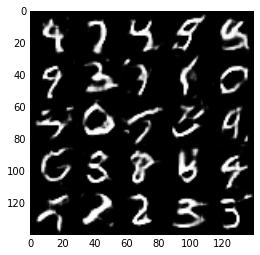

Epoch 1/2... Discriminator loss: 1.3767 Generator loss: 1.1672
Epoch 1/2... Discriminator loss: 1.3732 Generator loss: 0.9600
Epoch 1/2... Discriminator loss: 1.2160 Generator loss: 1.0037
Epoch 1/2... Discriminator loss: 1.3248 Generator loss: 0.8817
Epoch 1/2... Discriminator loss: 1.1694 Generator loss: 1.1560
Epoch 1/2... Discriminator loss: 1.1739 Generator loss: 1.0959
Epoch 1/2... Discriminator loss: 1.2048 Generator loss: 0.9756
Epoch 1/2... Discriminator loss: 1.1518 Generator loss: 0.9783
Epoch 1/2... Discriminator loss: 1.3650 Generator loss: 1.0150
Epoch 1/2... Discriminator loss: 1.2747 Generator loss: 1.1757


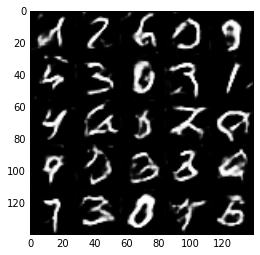

Epoch 1/2... Discriminator loss: 1.2320 Generator loss: 0.7919
Epoch 1/2... Discriminator loss: 1.1925 Generator loss: 0.8837
Epoch 1/2... Discriminator loss: 1.1833 Generator loss: 0.9594
Epoch 1/2... Discriminator loss: 1.2311 Generator loss: 1.0135
Epoch 1/2... Discriminator loss: 1.2890 Generator loss: 1.1284
Epoch 1/2... Discriminator loss: 1.4026 Generator loss: 1.3485
Epoch 1/2... Discriminator loss: 1.2688 Generator loss: 1.0187
Epoch 1/2... Discriminator loss: 1.2541 Generator loss: 0.8905
Epoch 1/2... Discriminator loss: 1.1536 Generator loss: 1.2490
Epoch 1/2... Discriminator loss: 1.1678 Generator loss: 0.9528


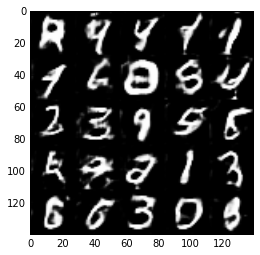

Epoch 1/2... Discriminator loss: 1.2008 Generator loss: 1.2709
Epoch 1/2... Discriminator loss: 1.1192 Generator loss: 0.9601
Epoch 1/2... Discriminator loss: 1.3939 Generator loss: 0.8964
Epoch 1/2... Discriminator loss: 1.3177 Generator loss: 0.9600
Epoch 1/2... Discriminator loss: 1.5275 Generator loss: 0.6858
Epoch 1/2... Discriminator loss: 1.2654 Generator loss: 0.8731
Epoch 1/2... Discriminator loss: 1.1863 Generator loss: 0.8030
Epoch 1/2... Discriminator loss: 1.2488 Generator loss: 0.8080
Epoch 1/2... Discriminator loss: 1.2999 Generator loss: 0.9033
Epoch 1/2... Discriminator loss: 1.1561 Generator loss: 0.9786


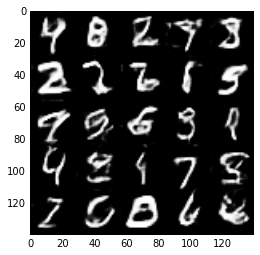

Epoch 1/2... Discriminator loss: 1.1566 Generator loss: 1.2636
Epoch 1/2... Discriminator loss: 1.1664 Generator loss: 1.0503
Epoch 1/2... Discriminator loss: 1.0782 Generator loss: 1.2518
Epoch 1/2... Discriminator loss: 1.4541 Generator loss: 0.9401
Epoch 1/2... Discriminator loss: 1.2883 Generator loss: 1.2260
Epoch 1/2... Discriminator loss: 1.2715 Generator loss: 0.9756
Epoch 1/2... Discriminator loss: 1.4622 Generator loss: 0.6394
Epoch 1/2... Discriminator loss: 1.1537 Generator loss: 1.0729
Epoch 1/2... Discriminator loss: 1.2759 Generator loss: 0.9060
Epoch 1/2... Discriminator loss: 1.2549 Generator loss: 1.3257


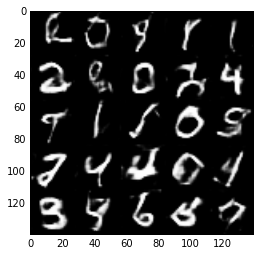

Epoch 1/2... Discriminator loss: 1.1563 Generator loss: 1.3520
Epoch 1/2... Discriminator loss: 1.3791 Generator loss: 0.7769
Epoch 1/2... Discriminator loss: 1.3002 Generator loss: 1.0043
Epoch 1/2... Discriminator loss: 1.1419 Generator loss: 1.1876
Epoch 1/2... Discriminator loss: 1.2565 Generator loss: 1.0450
Epoch 1/2... Discriminator loss: 1.0865 Generator loss: 1.2178
Epoch 1/2... Discriminator loss: 1.2787 Generator loss: 0.8486
Epoch 1/2... Discriminator loss: 1.1487 Generator loss: 1.1058
Epoch 1/2... Discriminator loss: 1.4057 Generator loss: 1.0343
Epoch 1/2... Discriminator loss: 1.0429 Generator loss: 1.2451


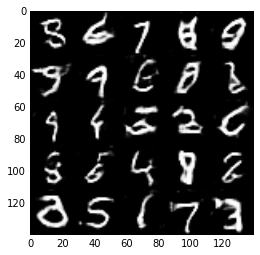

Epoch 1/2... Discriminator loss: 1.1842 Generator loss: 0.9555
Epoch 1/2... Discriminator loss: 1.1681 Generator loss: 1.6734
Epoch 1/2... Discriminator loss: 1.3016 Generator loss: 0.9113
Epoch 1/2... Discriminator loss: 1.2637 Generator loss: 1.0598
Epoch 1/2... Discriminator loss: 1.3012 Generator loss: 0.9238
Epoch 1/2... Discriminator loss: 1.3032 Generator loss: 0.7124
Epoch 1/2... Discriminator loss: 1.1256 Generator loss: 1.3511
Epoch 1/2... Discriminator loss: 1.2160 Generator loss: 1.2786
Epoch 1/2... Discriminator loss: 1.2811 Generator loss: 1.0802
Epoch 1/2... Discriminator loss: 1.3401 Generator loss: 0.8215


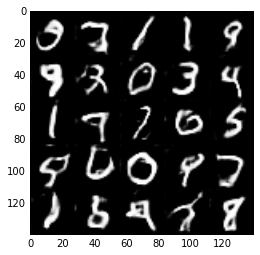

Epoch 1/2... Discriminator loss: 1.2129 Generator loss: 1.3190
Epoch 1/2... Discriminator loss: 1.2198 Generator loss: 0.8189
Epoch 1/2... Discriminator loss: 1.1067 Generator loss: 1.4777
Epoch 1/2... Discriminator loss: 1.1748 Generator loss: 1.2977
Epoch 1/2... Discriminator loss: 1.2796 Generator loss: 1.1312
Epoch 1/2... Discriminator loss: 1.2211 Generator loss: 0.9567
Epoch 1/2... Discriminator loss: 1.2924 Generator loss: 1.0805
Epoch 1/2... Discriminator loss: 1.2111 Generator loss: 0.8934
Epoch 1/2... Discriminator loss: 1.1202 Generator loss: 1.1122
Epoch 1/2... Discriminator loss: 1.0500 Generator loss: 1.0853


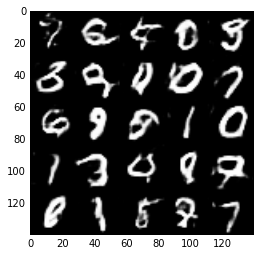

Epoch 1/2... Discriminator loss: 1.2546 Generator loss: 1.0246
Epoch 1/2... Discriminator loss: 1.2477 Generator loss: 1.2698
Epoch 1/2... Discriminator loss: 1.1112 Generator loss: 1.0236
Epoch 1/2... Discriminator loss: 1.0833 Generator loss: 1.1545
Epoch 1/2... Discriminator loss: 1.0446 Generator loss: 1.4236
Epoch 1/2... Discriminator loss: 1.1430 Generator loss: 1.1014
Epoch 1/2... Discriminator loss: 1.2640 Generator loss: 0.8350
Epoch 1/2... Discriminator loss: 1.1467 Generator loss: 1.0702
Epoch 1/2... Discriminator loss: 1.4191 Generator loss: 0.8098
Epoch 1/2... Discriminator loss: 1.2773 Generator loss: 1.0622


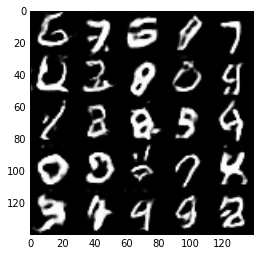

Epoch 1/2... Discriminator loss: 1.1415 Generator loss: 1.1939
Epoch 1/2... Discriminator loss: 1.3418 Generator loss: 1.3906
Epoch 1/2... Discriminator loss: 1.2932 Generator loss: 1.2007
Epoch 1/2... Discriminator loss: 1.2738 Generator loss: 0.8531
Epoch 1/2... Discriminator loss: 1.2263 Generator loss: 0.7967
Epoch 1/2... Discriminator loss: 1.4166 Generator loss: 0.7615
Epoch 1/2... Discriminator loss: 1.1791 Generator loss: 0.9569
Epoch 2/2... Discriminator loss: 1.2533 Generator loss: 1.1882
Epoch 2/2... Discriminator loss: 1.1511 Generator loss: 1.0108
Epoch 2/2... Discriminator loss: 1.1513 Generator loss: 0.8773


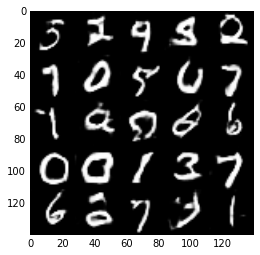

Epoch 2/2... Discriminator loss: 1.3597 Generator loss: 0.7689
Epoch 2/2... Discriminator loss: 1.3244 Generator loss: 0.9512
Epoch 2/2... Discriminator loss: 1.2322 Generator loss: 0.8806
Epoch 2/2... Discriminator loss: 1.3994 Generator loss: 1.0223
Epoch 2/2... Discriminator loss: 1.1418 Generator loss: 1.2395
Epoch 2/2... Discriminator loss: 1.3608 Generator loss: 0.8148
Epoch 2/2... Discriminator loss: 1.2193 Generator loss: 0.9680
Epoch 2/2... Discriminator loss: 1.2242 Generator loss: 1.1099
Epoch 2/2... Discriminator loss: 1.2397 Generator loss: 1.2599
Epoch 2/2... Discriminator loss: 1.2827 Generator loss: 0.9996


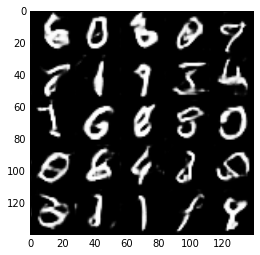

Epoch 2/2... Discriminator loss: 1.3295 Generator loss: 1.0744
Epoch 2/2... Discriminator loss: 1.1811 Generator loss: 1.1020
Epoch 2/2... Discriminator loss: 1.3025 Generator loss: 0.7282
Epoch 2/2... Discriminator loss: 1.1561 Generator loss: 0.8859
Epoch 2/2... Discriminator loss: 1.2484 Generator loss: 1.2072
Epoch 2/2... Discriminator loss: 1.2618 Generator loss: 0.9297
Epoch 2/2... Discriminator loss: 1.2691 Generator loss: 0.8620
Epoch 2/2... Discriminator loss: 1.3747 Generator loss: 1.1507
Epoch 2/2... Discriminator loss: 1.2458 Generator loss: 0.9610
Epoch 2/2... Discriminator loss: 1.1303 Generator loss: 1.2139


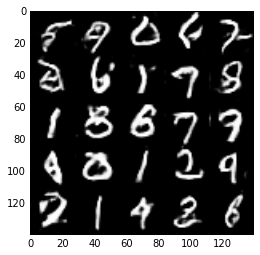

Epoch 2/2... Discriminator loss: 1.1996 Generator loss: 0.7918
Epoch 2/2... Discriminator loss: 1.3788 Generator loss: 0.9857
Epoch 2/2... Discriminator loss: 1.1596 Generator loss: 0.9628
Epoch 2/2... Discriminator loss: 1.3119 Generator loss: 1.2142
Epoch 2/2... Discriminator loss: 1.2785 Generator loss: 1.0466
Epoch 2/2... Discriminator loss: 1.3381 Generator loss: 1.0395
Epoch 2/2... Discriminator loss: 1.1663 Generator loss: 0.9326
Epoch 2/2... Discriminator loss: 1.0972 Generator loss: 0.8470
Epoch 2/2... Discriminator loss: 1.2211 Generator loss: 1.1219
Epoch 2/2... Discriminator loss: 1.2864 Generator loss: 1.0723


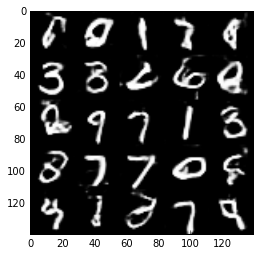

Epoch 2/2... Discriminator loss: 1.0822 Generator loss: 1.1769
Epoch 2/2... Discriminator loss: 1.0673 Generator loss: 1.1093
Epoch 2/2... Discriminator loss: 1.2072 Generator loss: 0.9629
Epoch 2/2... Discriminator loss: 1.4455 Generator loss: 0.8440
Epoch 2/2... Discriminator loss: 1.2832 Generator loss: 0.9705
Epoch 2/2... Discriminator loss: 1.2164 Generator loss: 1.2172
Epoch 2/2... Discriminator loss: 1.2972 Generator loss: 1.5684
Epoch 2/2... Discriminator loss: 1.1533 Generator loss: 1.2554
Epoch 2/2... Discriminator loss: 1.2922 Generator loss: 0.9374
Epoch 2/2... Discriminator loss: 1.3068 Generator loss: 1.2453


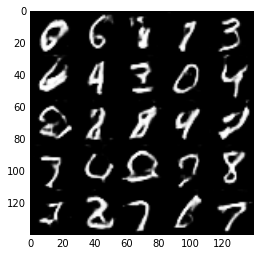

Epoch 2/2... Discriminator loss: 1.1935 Generator loss: 1.3026
Epoch 2/2... Discriminator loss: 1.2655 Generator loss: 1.1232
Epoch 2/2... Discriminator loss: 1.3690 Generator loss: 1.3255
Epoch 2/2... Discriminator loss: 1.1275 Generator loss: 0.9467
Epoch 2/2... Discriminator loss: 1.2734 Generator loss: 1.5618
Epoch 2/2... Discriminator loss: 1.2143 Generator loss: 0.9426
Epoch 2/2... Discriminator loss: 0.9907 Generator loss: 1.3216
Epoch 2/2... Discriminator loss: 1.0967 Generator loss: 1.3898
Epoch 2/2... Discriminator loss: 1.2173 Generator loss: 0.8974
Epoch 2/2... Discriminator loss: 1.1153 Generator loss: 1.2681


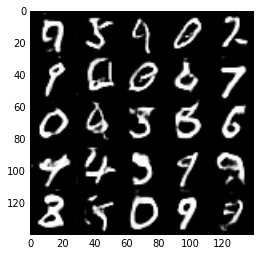

Epoch 2/2... Discriminator loss: 1.1589 Generator loss: 1.1610
Epoch 2/2... Discriminator loss: 1.3341 Generator loss: 1.0331
Epoch 2/2... Discriminator loss: 1.1819 Generator loss: 0.8881
Epoch 2/2... Discriminator loss: 1.2450 Generator loss: 1.0132
Epoch 2/2... Discriminator loss: 1.2636 Generator loss: 0.9522
Epoch 2/2... Discriminator loss: 1.1513 Generator loss: 1.0004
Epoch 2/2... Discriminator loss: 1.3646 Generator loss: 0.8242
Epoch 2/2... Discriminator loss: 1.3222 Generator loss: 1.1168
Epoch 2/2... Discriminator loss: 1.1097 Generator loss: 1.1346
Epoch 2/2... Discriminator loss: 1.1156 Generator loss: 0.9190


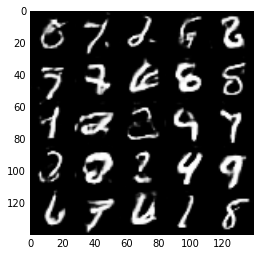

Epoch 2/2... Discriminator loss: 1.1680 Generator loss: 1.2328
Epoch 2/2... Discriminator loss: 1.2848 Generator loss: 1.3160
Epoch 2/2... Discriminator loss: 1.2689 Generator loss: 1.0716
Epoch 2/2... Discriminator loss: 1.1388 Generator loss: 1.2291
Epoch 2/2... Discriminator loss: 1.0284 Generator loss: 0.8238
Epoch 2/2... Discriminator loss: 1.2115 Generator loss: 1.1154
Epoch 2/2... Discriminator loss: 1.1620 Generator loss: 1.5136
Epoch 2/2... Discriminator loss: 1.3436 Generator loss: 1.2808
Epoch 2/2... Discriminator loss: 1.1752 Generator loss: 1.1251
Epoch 2/2... Discriminator loss: 1.4705 Generator loss: 0.6814


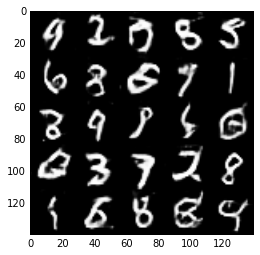

Epoch 2/2... Discriminator loss: 1.1961 Generator loss: 1.1930
Epoch 2/2... Discriminator loss: 1.1422 Generator loss: 1.1207
Epoch 2/2... Discriminator loss: 1.1139 Generator loss: 1.1348
Epoch 2/2... Discriminator loss: 1.2188 Generator loss: 1.0448
Epoch 2/2... Discriminator loss: 1.2572 Generator loss: 1.1407
Epoch 2/2... Discriminator loss: 1.2420 Generator loss: 1.1452
Epoch 2/2... Discriminator loss: 1.1763 Generator loss: 0.9375
Epoch 2/2... Discriminator loss: 1.3195 Generator loss: 0.9036
Epoch 2/2... Discriminator loss: 1.1075 Generator loss: 1.1589
Epoch 2/2... Discriminator loss: 1.2942 Generator loss: 1.4686


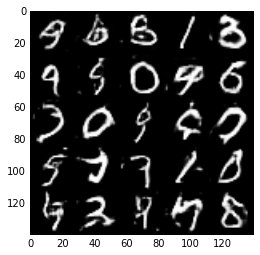

Epoch 2/2... Discriminator loss: 1.0491 Generator loss: 1.3233
Epoch 2/2... Discriminator loss: 1.1549 Generator loss: 0.9588
Epoch 2/2... Discriminator loss: 1.1314 Generator loss: 1.1845
Epoch 2/2... Discriminator loss: 1.2694 Generator loss: 1.0495
Epoch 2/2... Discriminator loss: 1.3470 Generator loss: 0.9687
Epoch 2/2... Discriminator loss: 1.2806 Generator loss: 0.9855
Epoch 2/2... Discriminator loss: 1.3162 Generator loss: 0.8785
Epoch 2/2... Discriminator loss: 1.2690 Generator loss: 0.8551
Epoch 2/2... Discriminator loss: 1.2428 Generator loss: 1.2665
Epoch 2/2... Discriminator loss: 1.1873 Generator loss: 0.9651


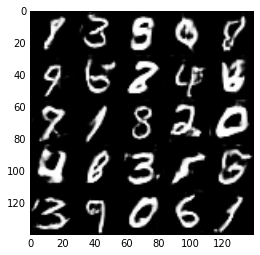

Epoch 2/2... Discriminator loss: 1.2392 Generator loss: 1.4635
Epoch 2/2... Discriminator loss: 1.1765 Generator loss: 0.9185
Epoch 2/2... Discriminator loss: 1.1985 Generator loss: 1.0844
Epoch 2/2... Discriminator loss: 1.3041 Generator loss: 1.2915
Epoch 2/2... Discriminator loss: 1.3459 Generator loss: 1.1277
Epoch 2/2... Discriminator loss: 1.3372 Generator loss: 1.5909
Epoch 2/2... Discriminator loss: 1.2548 Generator loss: 1.1941
Epoch 2/2... Discriminator loss: 1.1159 Generator loss: 1.5655
Epoch 2/2... Discriminator loss: 1.5275 Generator loss: 0.8849
Epoch 2/2... Discriminator loss: 1.1080 Generator loss: 1.2497


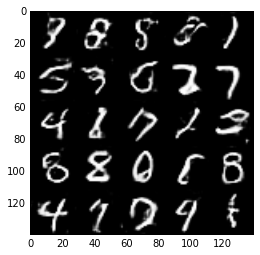

Epoch 2/2... Discriminator loss: 1.2236 Generator loss: 1.1654
Epoch 2/2... Discriminator loss: 1.1349 Generator loss: 1.3305
Epoch 2/2... Discriminator loss: 1.2963 Generator loss: 1.2247
Epoch 2/2... Discriminator loss: 1.2141 Generator loss: 1.1400
Epoch 2/2... Discriminator loss: 1.1509 Generator loss: 1.7161
Epoch 2/2... Discriminator loss: 1.1624 Generator loss: 1.0962
Epoch 2/2... Discriminator loss: 1.4022 Generator loss: 0.7549
Epoch 2/2... Discriminator loss: 1.0008 Generator loss: 1.0386
Epoch 2/2... Discriminator loss: 1.0085 Generator loss: 1.3747
Epoch 2/2... Discriminator loss: 1.0173 Generator loss: 0.9484


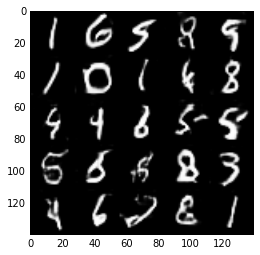

Epoch 2/2... Discriminator loss: 1.1826 Generator loss: 1.2209
Epoch 2/2... Discriminator loss: 1.2756 Generator loss: 1.3461
Epoch 2/2... Discriminator loss: 1.1242 Generator loss: 1.0259
Epoch 2/2... Discriminator loss: 1.0271 Generator loss: 1.0334
Epoch 2/2... Discriminator loss: 1.2753 Generator loss: 1.1824
Epoch 2/2... Discriminator loss: 1.0541 Generator loss: 1.0068
Epoch 2/2... Discriminator loss: 0.9993 Generator loss: 1.4488
Epoch 2/2... Discriminator loss: 1.1072 Generator loss: 1.1507
Epoch 2/2... Discriminator loss: 1.4491 Generator loss: 0.9112
Epoch 2/2... Discriminator loss: 1.3636 Generator loss: 0.8352


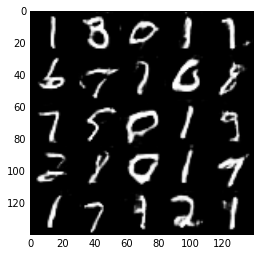

Epoch 2/2... Discriminator loss: 1.2297 Generator loss: 0.9609
Epoch 2/2... Discriminator loss: 1.1304 Generator loss: 1.3514
Epoch 2/2... Discriminator loss: 1.2060 Generator loss: 1.0751
Epoch 2/2... Discriminator loss: 0.8984 Generator loss: 1.4454
Epoch 2/2... Discriminator loss: 1.2172 Generator loss: 1.6828
Epoch 2/2... Discriminator loss: 1.2449 Generator loss: 1.0504
Epoch 2/2... Discriminator loss: 1.4254 Generator loss: 0.9456
Epoch 2/2... Discriminator loss: 1.2298 Generator loss: 2.0507
Epoch 2/2... Discriminator loss: 1.0500 Generator loss: 1.3982
Epoch 2/2... Discriminator loss: 1.1741 Generator loss: 1.5350


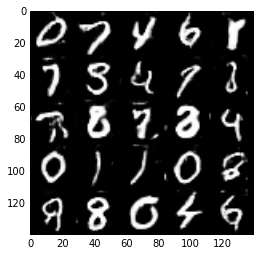

Epoch 2/2... Discriminator loss: 1.0295 Generator loss: 1.1544
Epoch 2/2... Discriminator loss: 1.1146 Generator loss: 1.1312
Epoch 2/2... Discriminator loss: 1.1041 Generator loss: 1.3237
Epoch 2/2... Discriminator loss: 1.0030 Generator loss: 1.6792
Epoch 2/2... Discriminator loss: 1.1876 Generator loss: 1.3084
Epoch 2/2... Discriminator loss: 1.2107 Generator loss: 1.0266
Epoch 2/2... Discriminator loss: 1.0336 Generator loss: 1.0813
Epoch 2/2... Discriminator loss: 1.3790 Generator loss: 1.0289
Epoch 2/2... Discriminator loss: 1.0215 Generator loss: 1.1146
Epoch 2/2... Discriminator loss: 1.1052 Generator loss: 1.0369


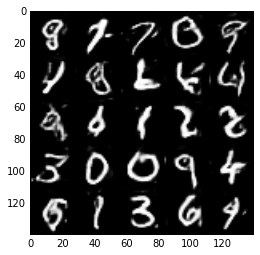

Epoch 2/2... Discriminator loss: 1.3414 Generator loss: 1.0074
Epoch 2/2... Discriminator loss: 1.2167 Generator loss: 1.0358
Epoch 2/2... Discriminator loss: 1.2350 Generator loss: 1.4497
Epoch 2/2... Discriminator loss: 1.0123 Generator loss: 1.3941
Epoch 2/2... Discriminator loss: 1.1126 Generator loss: 1.2096
Epoch 2/2... Discriminator loss: 1.0422 Generator loss: 1.7031
Epoch 2/2... Discriminator loss: 1.2738 Generator loss: 0.9266
Epoch 2/2... Discriminator loss: 1.3145 Generator loss: 0.9961
Epoch 2/2... Discriminator loss: 1.2629 Generator loss: 1.4448
Epoch 2/2... Discriminator loss: 1.1756 Generator loss: 1.7410


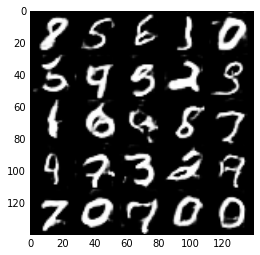

Epoch 2/2... Discriminator loss: 1.1478 Generator loss: 0.9434
Epoch 2/2... Discriminator loss: 0.9833 Generator loss: 1.5238
Epoch 2/2... Discriminator loss: 1.1239 Generator loss: 1.3584
Epoch 2/2... Discriminator loss: 1.2891 Generator loss: 0.8256
Epoch 2/2... Discriminator loss: 1.4419 Generator loss: 1.1973
Epoch 2/2... Discriminator loss: 1.2896 Generator loss: 1.2615
Epoch 2/2... Discriminator loss: 1.1834 Generator loss: 1.2586
Epoch 2/2... Discriminator loss: 1.1201 Generator loss: 1.2382
Epoch 2/2... Discriminator loss: 1.5282 Generator loss: 0.6269
Epoch 2/2... Discriminator loss: 1.4059 Generator loss: 1.4424


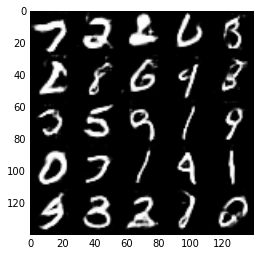

Epoch 2/2... Discriminator loss: 1.0887 Generator loss: 1.2596
Epoch 2/2... Discriminator loss: 0.9445 Generator loss: 1.0860
Epoch 2/2... Discriminator loss: 1.2510 Generator loss: 1.2535
Epoch 2/2... Discriminator loss: 1.1209 Generator loss: 1.4184
Epoch 2/2... Discriminator loss: 1.3065 Generator loss: 1.6287
Epoch 2/2... Discriminator loss: 1.0753 Generator loss: 1.1440
Epoch 2/2... Discriminator loss: 1.1427 Generator loss: 1.2854
Epoch 2/2... Discriminator loss: 1.2036 Generator loss: 1.5719
Epoch 2/2... Discriminator loss: 1.0956 Generator loss: 0.9867
Epoch 2/2... Discriminator loss: 1.1461 Generator loss: 1.5545


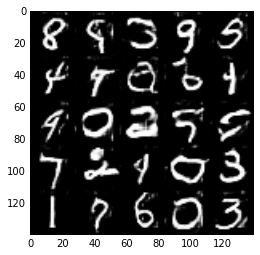

Epoch 2/2... Discriminator loss: 1.1108 Generator loss: 1.0509
Epoch 2/2... Discriminator loss: 1.2036 Generator loss: 0.9001
Epoch 2/2... Discriminator loss: 0.9343 Generator loss: 0.8945
Epoch 2/2... Discriminator loss: 1.0495 Generator loss: 1.1749
Epoch 2/2... Discriminator loss: 1.2182 Generator loss: 1.0457
Epoch 2/2... Discriminator loss: 1.1050 Generator loss: 1.4848
Epoch 2/2... Discriminator loss: 1.0265 Generator loss: 1.3406
Epoch 2/2... Discriminator loss: 1.0364 Generator loss: 0.9442
Epoch 2/2... Discriminator loss: 1.1569 Generator loss: 1.0048
Epoch 2/2... Discriminator loss: 1.2194 Generator loss: 0.7707


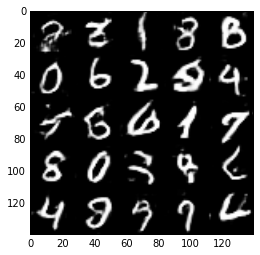

Epoch 2/2... Discriminator loss: 1.1148 Generator loss: 0.9283
Epoch 2/2... Discriminator loss: 0.9701 Generator loss: 1.1116
Epoch 2/2... Discriminator loss: 1.1577 Generator loss: 1.2080
Epoch 2/2... Discriminator loss: 1.0807 Generator loss: 1.2652
Epoch 2/2... Discriminator loss: 1.2818 Generator loss: 1.4068


In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0008
beta1 = 0.5

epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA


Epoch 1/1... Discriminator loss: 0.7950 Generator loss: 4.3187
Epoch 1/1... Discriminator loss: 0.7161 Generator loss: 3.4635
Epoch 1/1... Discriminator loss: 0.8809 Generator loss: 3.0802
Epoch 1/1... Discriminator loss: 0.4581 Generator loss: 3.7237
Epoch 1/1... Discriminator loss: 0.7229 Generator loss: 3.8234
Epoch 1/1... Discriminator loss: 1.0280 Generator loss: 2.3879
Epoch 1/1... Discriminator loss: 1.4792 Generator loss: 0.8058
Epoch 1/1... Discriminator loss: 0.9087 Generator loss: 1.7871
Epoch 1/1... Discriminator loss: 0.8704 Generator loss: 1.6594
Epoch 1/1... Discriminator loss: 1.1254 Generator loss: 2.1978


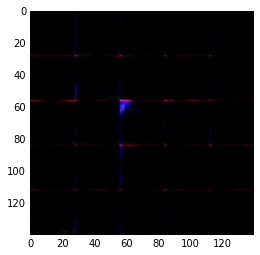

Epoch 1/1... Discriminator loss: 1.1025 Generator loss: 1.9607
Epoch 1/1... Discriminator loss: 1.5197 Generator loss: 0.7378
Epoch 1/1... Discriminator loss: 0.8985 Generator loss: 1.4231
Epoch 1/1... Discriminator loss: 1.2687 Generator loss: 1.0192
Epoch 1/1... Discriminator loss: 1.1809 Generator loss: 1.3693
Epoch 1/1... Discriminator loss: 1.0899 Generator loss: 1.1248
Epoch 1/1... Discriminator loss: 1.3140 Generator loss: 1.8851
Epoch 1/1... Discriminator loss: 1.3677 Generator loss: 1.0181
Epoch 1/1... Discriminator loss: 1.2823 Generator loss: 0.8169
Epoch 1/1... Discriminator loss: 1.0452 Generator loss: 1.6037


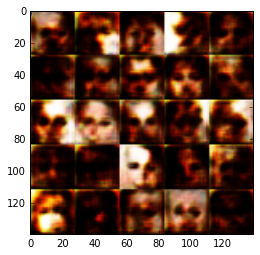

Epoch 1/1... Discriminator loss: 1.9993 Generator loss: 3.4944
Epoch 1/1... Discriminator loss: 1.1122 Generator loss: 1.0056
Epoch 1/1... Discriminator loss: 0.9708 Generator loss: 1.1829
Epoch 1/1... Discriminator loss: 2.2672 Generator loss: 0.2825
Epoch 1/1... Discriminator loss: 1.1101 Generator loss: 1.3741
Epoch 1/1... Discriminator loss: 1.1073 Generator loss: 1.5279
Epoch 1/1... Discriminator loss: 1.1663 Generator loss: 1.1822
Epoch 1/1... Discriminator loss: 1.5783 Generator loss: 0.6541
Epoch 1/1... Discriminator loss: 1.0613 Generator loss: 1.3517
Epoch 1/1... Discriminator loss: 0.6164 Generator loss: 2.9246


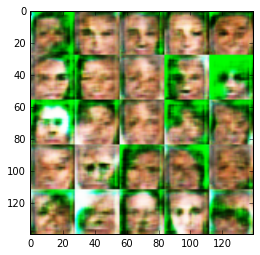

Epoch 1/1... Discriminator loss: 1.2464 Generator loss: 1.4779
Epoch 1/1... Discriminator loss: 1.0471 Generator loss: 1.0607
Epoch 1/1... Discriminator loss: 1.5647 Generator loss: 0.5613
Epoch 1/1... Discriminator loss: 1.7065 Generator loss: 0.6203
Epoch 1/1... Discriminator loss: 1.2110 Generator loss: 1.1579
Epoch 1/1... Discriminator loss: 1.3049 Generator loss: 0.8902
Epoch 1/1... Discriminator loss: 1.0607 Generator loss: 1.9497
Epoch 1/1... Discriminator loss: 1.0279 Generator loss: 1.4993
Epoch 1/1... Discriminator loss: 1.1446 Generator loss: 1.0582
Epoch 1/1... Discriminator loss: 1.1809 Generator loss: 1.0404


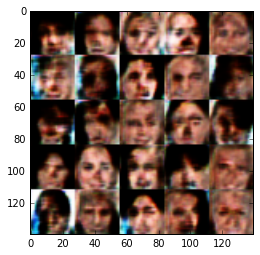

Epoch 1/1... Discriminator loss: 1.1522 Generator loss: 0.9197
Epoch 1/1... Discriminator loss: 0.8357 Generator loss: 1.1251
Epoch 1/1... Discriminator loss: 1.0846 Generator loss: 0.9585
Epoch 1/1... Discriminator loss: 1.0918 Generator loss: 1.1957
Epoch 1/1... Discriminator loss: 1.7046 Generator loss: 0.5115
Epoch 1/1... Discriminator loss: 1.2025 Generator loss: 1.0117
Epoch 1/1... Discriminator loss: 1.3686 Generator loss: 1.7431
Epoch 1/1... Discriminator loss: 1.0852 Generator loss: 1.0173
Epoch 1/1... Discriminator loss: 0.6536 Generator loss: 1.3807
Epoch 1/1... Discriminator loss: 1.4571 Generator loss: 1.8208


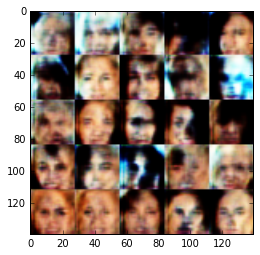

Epoch 1/1... Discriminator loss: 0.9771 Generator loss: 0.9943
Epoch 1/1... Discriminator loss: 1.1273 Generator loss: 1.4350
Epoch 1/1... Discriminator loss: 0.8245 Generator loss: 1.3384
Epoch 1/1... Discriminator loss: 1.1758 Generator loss: 1.2241
Epoch 1/1... Discriminator loss: 0.5802 Generator loss: 1.8732
Epoch 1/1... Discriminator loss: 1.1996 Generator loss: 1.1280
Epoch 1/1... Discriminator loss: 1.3618 Generator loss: 1.0947
Epoch 1/1... Discriminator loss: 1.0774 Generator loss: 0.8655
Epoch 1/1... Discriminator loss: 1.3341 Generator loss: 1.8687
Epoch 1/1... Discriminator loss: 0.5558 Generator loss: 2.3210


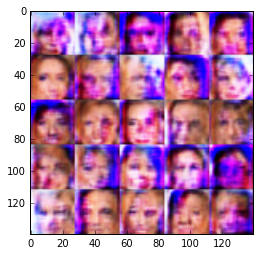

Epoch 1/1... Discriminator loss: 1.6431 Generator loss: 2.0959
Epoch 1/1... Discriminator loss: 1.3445 Generator loss: 1.1810
Epoch 1/1... Discriminator loss: 0.7818 Generator loss: 1.4176
Epoch 1/1... Discriminator loss: 1.0654 Generator loss: 0.6865
Epoch 1/1... Discriminator loss: 2.2692 Generator loss: 3.6222
Epoch 1/1... Discriminator loss: 0.8583 Generator loss: 1.6911
Epoch 1/1... Discriminator loss: 2.2124 Generator loss: 0.2359
Epoch 1/1... Discriminator loss: 0.5302 Generator loss: 2.5283
Epoch 1/1... Discriminator loss: 1.1410 Generator loss: 2.0540
Epoch 1/1... Discriminator loss: 1.3888 Generator loss: 0.5367


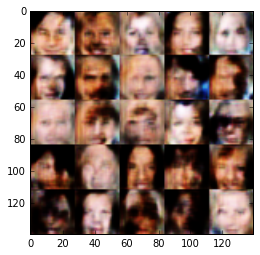

Epoch 1/1... Discriminator loss: 1.0633 Generator loss: 1.0889
Epoch 1/1... Discriminator loss: 0.5927 Generator loss: 2.3958
Epoch 1/1... Discriminator loss: 0.9587 Generator loss: 1.3246
Epoch 1/1... Discriminator loss: 1.2526 Generator loss: 1.1414
Epoch 1/1... Discriminator loss: 0.9642 Generator loss: 1.0514
Epoch 1/1... Discriminator loss: 1.4928 Generator loss: 1.0200
Epoch 1/1... Discriminator loss: 1.1561 Generator loss: 1.2887
Epoch 1/1... Discriminator loss: 1.3614 Generator loss: 0.6354
Epoch 1/1... Discriminator loss: 1.4139 Generator loss: 1.0047
Epoch 1/1... Discriminator loss: 1.2877 Generator loss: 0.9278


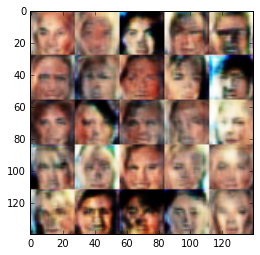

Epoch 1/1... Discriminator loss: 1.1347 Generator loss: 0.8732
Epoch 1/1... Discriminator loss: 0.9803 Generator loss: 1.5485
Epoch 1/1... Discriminator loss: 1.4103 Generator loss: 0.4436
Epoch 1/1... Discriminator loss: 1.0354 Generator loss: 0.9473
Epoch 1/1... Discriminator loss: 1.4498 Generator loss: 0.6041
Epoch 1/1... Discriminator loss: 0.8754 Generator loss: 1.1493
Epoch 1/1... Discriminator loss: 1.2029 Generator loss: 0.8766
Epoch 1/1... Discriminator loss: 1.0923 Generator loss: 1.0466
Epoch 1/1... Discriminator loss: 1.2766 Generator loss: 0.9709
Epoch 1/1... Discriminator loss: 1.1463 Generator loss: 1.9593


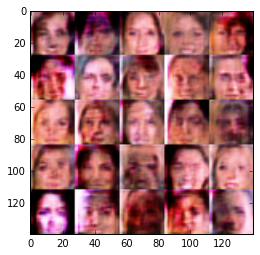

Epoch 1/1... Discriminator loss: 1.4360 Generator loss: 0.4216
Epoch 1/1... Discriminator loss: 1.2544 Generator loss: 0.7546
Epoch 1/1... Discriminator loss: 1.1704 Generator loss: 1.2809
Epoch 1/1... Discriminator loss: 0.9574 Generator loss: 1.8778
Epoch 1/1... Discriminator loss: 0.5965 Generator loss: 1.7888
Epoch 1/1... Discriminator loss: 0.9577 Generator loss: 0.9813
Epoch 1/1... Discriminator loss: 1.1122 Generator loss: 1.2209
Epoch 1/1... Discriminator loss: 1.4993 Generator loss: 0.8069
Epoch 1/1... Discriminator loss: 1.3723 Generator loss: 0.8397
Epoch 1/1... Discriminator loss: 1.0354 Generator loss: 1.0586


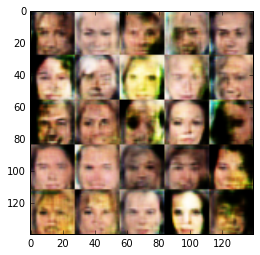

Epoch 1/1... Discriminator loss: 1.3231 Generator loss: 0.7503
Epoch 1/1... Discriminator loss: 1.3621 Generator loss: 0.7365
Epoch 1/1... Discriminator loss: 1.0916 Generator loss: 1.3332
Epoch 1/1... Discriminator loss: 1.1752 Generator loss: 0.8573
Epoch 1/1... Discriminator loss: 1.1015 Generator loss: 1.2094
Epoch 1/1... Discriminator loss: 1.6139 Generator loss: 0.8851
Epoch 1/1... Discriminator loss: 1.2055 Generator loss: 0.7869
Epoch 1/1... Discriminator loss: 1.3244 Generator loss: 1.2336
Epoch 1/1... Discriminator loss: 1.2367 Generator loss: 1.1522
Epoch 1/1... Discriminator loss: 1.2799 Generator loss: 0.9764


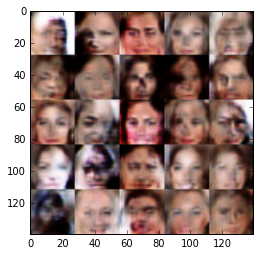

Epoch 1/1... Discriminator loss: 1.0779 Generator loss: 1.3499
Epoch 1/1... Discriminator loss: 1.1699 Generator loss: 1.0915
Epoch 1/1... Discriminator loss: 1.2134 Generator loss: 1.4735
Epoch 1/1... Discriminator loss: 1.3142 Generator loss: 0.8765
Epoch 1/1... Discriminator loss: 1.3414 Generator loss: 0.7830
Epoch 1/1... Discriminator loss: 1.1139 Generator loss: 1.0474
Epoch 1/1... Discriminator loss: 0.7184 Generator loss: 1.7301
Epoch 1/1... Discriminator loss: 1.2699 Generator loss: 1.1031
Epoch 1/1... Discriminator loss: 1.2281 Generator loss: 1.4239
Epoch 1/1... Discriminator loss: 1.3071 Generator loss: 0.6905


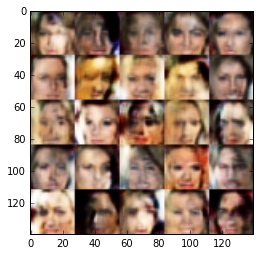

Epoch 1/1... Discriminator loss: 1.2143 Generator loss: 1.1554
Epoch 1/1... Discriminator loss: 1.2119 Generator loss: 1.1117
Epoch 1/1... Discriminator loss: 1.6763 Generator loss: 0.6246
Epoch 1/1... Discriminator loss: 1.3829 Generator loss: 0.7320
Epoch 1/1... Discriminator loss: 1.1019 Generator loss: 1.1529
Epoch 1/1... Discriminator loss: 1.0312 Generator loss: 1.1782
Epoch 1/1... Discriminator loss: 1.1920 Generator loss: 1.0544
Epoch 1/1... Discriminator loss: 1.0181 Generator loss: 1.2811
Epoch 1/1... Discriminator loss: 1.4328 Generator loss: 0.5393
Epoch 1/1... Discriminator loss: 0.9434 Generator loss: 1.6865


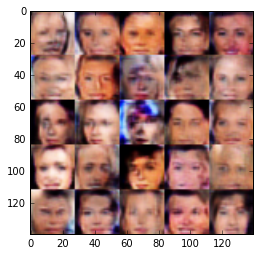

Epoch 1/1... Discriminator loss: 1.1781 Generator loss: 1.0613
Epoch 1/1... Discriminator loss: 1.2464 Generator loss: 0.9439
Epoch 1/1... Discriminator loss: 1.1216 Generator loss: 0.9956
Epoch 1/1... Discriminator loss: 1.1032 Generator loss: 1.1813
Epoch 1/1... Discriminator loss: 1.1919 Generator loss: 1.0639
Epoch 1/1... Discriminator loss: 1.2682 Generator loss: 1.0096
Epoch 1/1... Discriminator loss: 1.2865 Generator loss: 0.8859
Epoch 1/1... Discriminator loss: 1.5971 Generator loss: 0.6739
Epoch 1/1... Discriminator loss: 1.3440 Generator loss: 0.9667
Epoch 1/1... Discriminator loss: 1.1464 Generator loss: 0.8483


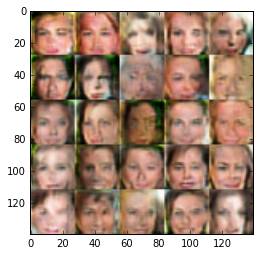

Epoch 1/1... Discriminator loss: 1.2777 Generator loss: 0.9842
Epoch 1/1... Discriminator loss: 1.3839 Generator loss: 1.0639
Epoch 1/1... Discriminator loss: 1.1987 Generator loss: 1.1929
Epoch 1/1... Discriminator loss: 1.3441 Generator loss: 0.7780
Epoch 1/1... Discriminator loss: 1.5444 Generator loss: 0.7937
Epoch 1/1... Discriminator loss: 1.2393 Generator loss: 0.9410
Epoch 1/1... Discriminator loss: 1.4574 Generator loss: 0.7947
Epoch 1/1... Discriminator loss: 1.3434 Generator loss: 0.8332
Epoch 1/1... Discriminator loss: 1.4638 Generator loss: 0.7176
Epoch 1/1... Discriminator loss: 1.1855 Generator loss: 1.0007


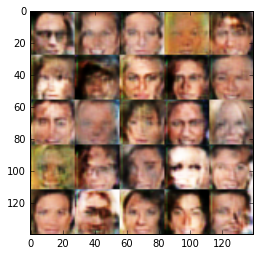

Epoch 1/1... Discriminator loss: 1.4298 Generator loss: 0.9831
Epoch 1/1... Discriminator loss: 1.2842 Generator loss: 0.7023
Epoch 1/1... Discriminator loss: 1.2681 Generator loss: 1.0485
Epoch 1/1... Discriminator loss: 1.5205 Generator loss: 0.7247
Epoch 1/1... Discriminator loss: 1.4893 Generator loss: 0.8171
Epoch 1/1... Discriminator loss: 1.2681 Generator loss: 1.1714
Epoch 1/1... Discriminator loss: 1.1887 Generator loss: 1.2041
Epoch 1/1... Discriminator loss: 1.2428 Generator loss: 1.4077
Epoch 1/1... Discriminator loss: 1.2648 Generator loss: 0.9618
Epoch 1/1... Discriminator loss: 1.2172 Generator loss: 1.0178


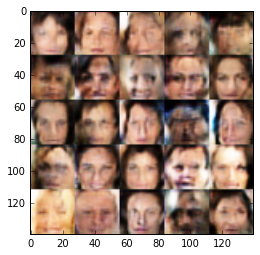

Epoch 1/1... Discriminator loss: 1.2280 Generator loss: 1.1687
Epoch 1/1... Discriminator loss: 1.1656 Generator loss: 1.0252
Epoch 1/1... Discriminator loss: 1.4232 Generator loss: 0.8629
Epoch 1/1... Discriminator loss: 1.2591 Generator loss: 1.2659
Epoch 1/1... Discriminator loss: 1.2294 Generator loss: 1.3264
Epoch 1/1... Discriminator loss: 1.4993 Generator loss: 0.7617
Epoch 1/1... Discriminator loss: 1.3337 Generator loss: 0.7555
Epoch 1/1... Discriminator loss: 1.3718 Generator loss: 0.8009
Epoch 1/1... Discriminator loss: 1.3199 Generator loss: 0.9167
Epoch 1/1... Discriminator loss: 1.3024 Generator loss: 1.1083


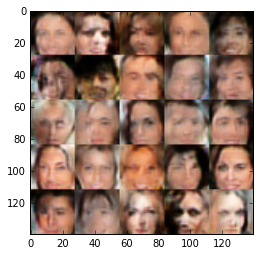

Epoch 1/1... Discriminator loss: 1.3113 Generator loss: 0.8995
Epoch 1/1... Discriminator loss: 1.2195 Generator loss: 0.8887
Epoch 1/1... Discriminator loss: 1.2170 Generator loss: 0.8451
Epoch 1/1... Discriminator loss: 1.2387 Generator loss: 0.9040
Epoch 1/1... Discriminator loss: 1.2205 Generator loss: 0.8639
Epoch 1/1... Discriminator loss: 1.4635 Generator loss: 0.7944
Epoch 1/1... Discriminator loss: 1.2144 Generator loss: 1.1566
Epoch 1/1... Discriminator loss: 1.4698 Generator loss: 0.7350
Epoch 1/1... Discriminator loss: 1.5935 Generator loss: 0.7490
Epoch 1/1... Discriminator loss: 1.4448 Generator loss: 0.8173


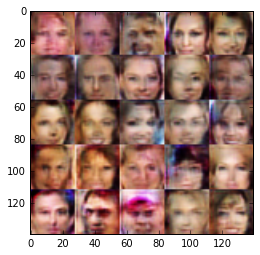

Epoch 1/1... Discriminator loss: 1.1819 Generator loss: 1.1370
Epoch 1/1... Discriminator loss: 1.3075 Generator loss: 0.9964
Epoch 1/1... Discriminator loss: 1.3204 Generator loss: 0.8197
Epoch 1/1... Discriminator loss: 1.2149 Generator loss: 0.8253
Epoch 1/1... Discriminator loss: 1.3476 Generator loss: 0.7485
Epoch 1/1... Discriminator loss: 1.2556 Generator loss: 1.0821
Epoch 1/1... Discriminator loss: 1.2395 Generator loss: 0.9398
Epoch 1/1... Discriminator loss: 1.1268 Generator loss: 0.9028
Epoch 1/1... Discriminator loss: 1.5409 Generator loss: 0.9128
Epoch 1/1... Discriminator loss: 1.4019 Generator loss: 0.8818


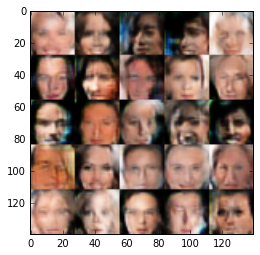

Epoch 1/1... Discriminator loss: 1.2277 Generator loss: 1.0298
Epoch 1/1... Discriminator loss: 1.4185 Generator loss: 0.7980
Epoch 1/1... Discriminator loss: 1.1409 Generator loss: 0.8346
Epoch 1/1... Discriminator loss: 1.4024 Generator loss: 0.6778
Epoch 1/1... Discriminator loss: 1.4048 Generator loss: 0.9006
Epoch 1/1... Discriminator loss: 1.2140 Generator loss: 0.9440
Epoch 1/1... Discriminator loss: 1.3930 Generator loss: 0.7829
Epoch 1/1... Discriminator loss: 1.2676 Generator loss: 0.9537
Epoch 1/1... Discriminator loss: 1.1394 Generator loss: 1.0082
Epoch 1/1... Discriminator loss: 1.5079 Generator loss: 0.5873


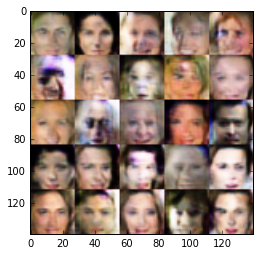

Epoch 1/1... Discriminator loss: 1.5371 Generator loss: 0.7688
Epoch 1/1... Discriminator loss: 1.2253 Generator loss: 0.8912
Epoch 1/1... Discriminator loss: 1.4160 Generator loss: 0.8037
Epoch 1/1... Discriminator loss: 1.1462 Generator loss: 0.8952
Epoch 1/1... Discriminator loss: 1.2772 Generator loss: 0.9212
Epoch 1/1... Discriminator loss: 1.2873 Generator loss: 0.8963
Epoch 1/1... Discriminator loss: 1.2970 Generator loss: 0.7851
Epoch 1/1... Discriminator loss: 1.3221 Generator loss: 0.7856
Epoch 1/1... Discriminator loss: 1.4580 Generator loss: 0.7598
Epoch 1/1... Discriminator loss: 1.4689 Generator loss: 0.8732


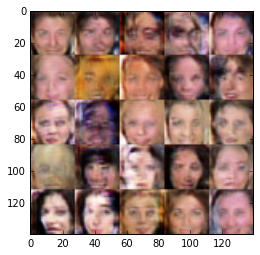

Epoch 1/1... Discriminator loss: 1.2670 Generator loss: 0.8993
Epoch 1/1... Discriminator loss: 1.3041 Generator loss: 1.1495
Epoch 1/1... Discriminator loss: 1.1619 Generator loss: 0.9579
Epoch 1/1... Discriminator loss: 1.1265 Generator loss: 0.9752
Epoch 1/1... Discriminator loss: 1.3784 Generator loss: 1.0022
Epoch 1/1... Discriminator loss: 1.2321 Generator loss: 0.9523
Epoch 1/1... Discriminator loss: 1.3084 Generator loss: 0.8013
Epoch 1/1... Discriminator loss: 1.3162 Generator loss: 1.1177
Epoch 1/1... Discriminator loss: 1.5157 Generator loss: 0.7616
Epoch 1/1... Discriminator loss: 1.3575 Generator loss: 0.8344


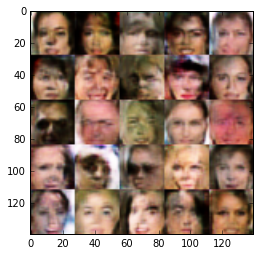

Epoch 1/1... Discriminator loss: 1.3157 Generator loss: 0.6987
Epoch 1/1... Discriminator loss: 1.3031 Generator loss: 1.0161
Epoch 1/1... Discriminator loss: 1.3093 Generator loss: 1.1284
Epoch 1/1... Discriminator loss: 1.2209 Generator loss: 1.0123
Epoch 1/1... Discriminator loss: 1.4271 Generator loss: 0.7886
Epoch 1/1... Discriminator loss: 1.4221 Generator loss: 0.7357
Epoch 1/1... Discriminator loss: 1.2070 Generator loss: 0.7822
Epoch 1/1... Discriminator loss: 1.3446 Generator loss: 0.8937
Epoch 1/1... Discriminator loss: 1.2620 Generator loss: 1.0345
Epoch 1/1... Discriminator loss: 1.2503 Generator loss: 0.9643


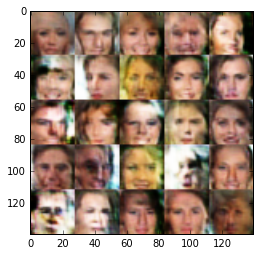

Epoch 1/1... Discriminator loss: 1.3503 Generator loss: 0.8572
Epoch 1/1... Discriminator loss: 1.2956 Generator loss: 0.7851
Epoch 1/1... Discriminator loss: 1.0975 Generator loss: 1.6396
Epoch 1/1... Discriminator loss: 1.2659 Generator loss: 0.9219
Epoch 1/1... Discriminator loss: 1.2065 Generator loss: 0.8612
Epoch 1/1... Discriminator loss: 1.5292 Generator loss: 0.6524
Epoch 1/1... Discriminator loss: 1.2663 Generator loss: 0.8617
Epoch 1/1... Discriminator loss: 1.2734 Generator loss: 0.9242
Epoch 1/1... Discriminator loss: 1.4144 Generator loss: 0.8692
Epoch 1/1... Discriminator loss: 1.2467 Generator loss: 0.9418


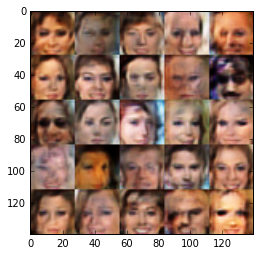

Epoch 1/1... Discriminator loss: 1.2743 Generator loss: 0.9644
Epoch 1/1... Discriminator loss: 1.4478 Generator loss: 0.8484
Epoch 1/1... Discriminator loss: 1.3757 Generator loss: 0.9755
Epoch 1/1... Discriminator loss: 1.2377 Generator loss: 0.8558
Epoch 1/1... Discriminator loss: 1.3094 Generator loss: 0.7790
Epoch 1/1... Discriminator loss: 1.3858 Generator loss: 0.8775
Epoch 1/1... Discriminator loss: 1.3065 Generator loss: 0.6013
Epoch 1/1... Discriminator loss: 1.2317 Generator loss: 0.8671
Epoch 1/1... Discriminator loss: 1.3774 Generator loss: 0.7802
Epoch 1/1... Discriminator loss: 1.1495 Generator loss: 0.8599


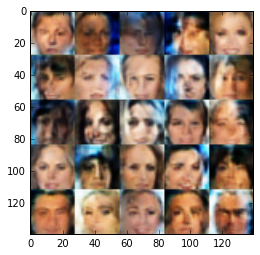

Epoch 1/1... Discriminator loss: 1.3350 Generator loss: 0.8622
Epoch 1/1... Discriminator loss: 1.1504 Generator loss: 1.0716
Epoch 1/1... Discriminator loss: 1.3817 Generator loss: 0.9784
Epoch 1/1... Discriminator loss: 1.0664 Generator loss: 1.2041
Epoch 1/1... Discriminator loss: 1.4184 Generator loss: 0.7602
Epoch 1/1... Discriminator loss: 1.4340 Generator loss: 0.8831
Epoch 1/1... Discriminator loss: 1.3326 Generator loss: 1.2554
Epoch 1/1... Discriminator loss: 1.2725 Generator loss: 1.0687
Epoch 1/1... Discriminator loss: 1.2799 Generator loss: 0.8617
Epoch 1/1... Discriminator loss: 1.2708 Generator loss: 0.9859


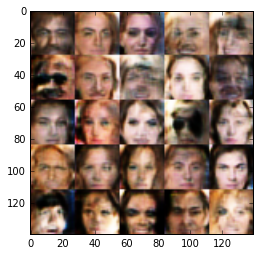

Epoch 1/1... Discriminator loss: 1.2232 Generator loss: 0.7700
Epoch 1/1... Discriminator loss: 1.3368 Generator loss: 1.0090
Epoch 1/1... Discriminator loss: 1.4644 Generator loss: 1.0386
Epoch 1/1... Discriminator loss: 1.0810 Generator loss: 0.8782
Epoch 1/1... Discriminator loss: 1.4008 Generator loss: 0.7252
Epoch 1/1... Discriminator loss: 1.2730 Generator loss: 0.7916
Epoch 1/1... Discriminator loss: 1.2824 Generator loss: 0.9725
Epoch 1/1... Discriminator loss: 1.3581 Generator loss: 0.7867
Epoch 1/1... Discriminator loss: 1.3096 Generator loss: 0.7596
Epoch 1/1... Discriminator loss: 1.1801 Generator loss: 1.1863


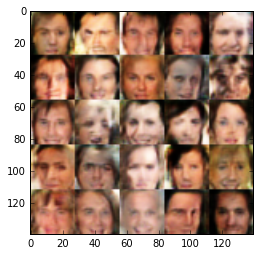

Epoch 1/1... Discriminator loss: 1.3000 Generator loss: 1.0816
Epoch 1/1... Discriminator loss: 1.2217 Generator loss: 0.9756
Epoch 1/1... Discriminator loss: 1.3056 Generator loss: 0.9494
Epoch 1/1... Discriminator loss: 1.3360 Generator loss: 0.9342
Epoch 1/1... Discriminator loss: 1.4151 Generator loss: 0.9370
Epoch 1/1... Discriminator loss: 1.2463 Generator loss: 1.0631
Epoch 1/1... Discriminator loss: 1.3355 Generator loss: 0.6110
Epoch 1/1... Discriminator loss: 1.3493 Generator loss: 0.9237
Epoch 1/1... Discriminator loss: 1.2857 Generator loss: 0.7307
Epoch 1/1... Discriminator loss: 1.3791 Generator loss: 0.9236


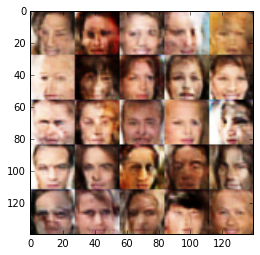

Epoch 1/1... Discriminator loss: 1.2645 Generator loss: 0.9537
Epoch 1/1... Discriminator loss: 1.2656 Generator loss: 0.9525
Epoch 1/1... Discriminator loss: 1.2888 Generator loss: 0.9618
Epoch 1/1... Discriminator loss: 1.4317 Generator loss: 0.8328
Epoch 1/1... Discriminator loss: 1.2855 Generator loss: 1.0862
Epoch 1/1... Discriminator loss: 1.4185 Generator loss: 0.8643
Epoch 1/1... Discriminator loss: 1.4848 Generator loss: 0.5793
Epoch 1/1... Discriminator loss: 1.4188 Generator loss: 0.9050
Epoch 1/1... Discriminator loss: 1.3526 Generator loss: 0.9388
Epoch 1/1... Discriminator loss: 1.2510 Generator loss: 1.0086


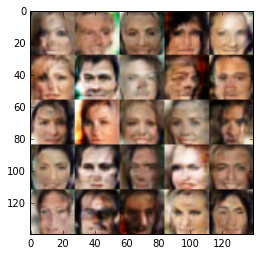

Epoch 1/1... Discriminator loss: 1.2952 Generator loss: 0.9249
Epoch 1/1... Discriminator loss: 1.3726 Generator loss: 0.8503
Epoch 1/1... Discriminator loss: 1.2251 Generator loss: 0.9230
Epoch 1/1... Discriminator loss: 1.4305 Generator loss: 0.9897
Epoch 1/1... Discriminator loss: 1.5211 Generator loss: 0.8084
Epoch 1/1... Discriminator loss: 1.1586 Generator loss: 1.1016
Epoch 1/1... Discriminator loss: 1.2320 Generator loss: 0.9140
Epoch 1/1... Discriminator loss: 1.2898 Generator loss: 0.9416
Epoch 1/1... Discriminator loss: 1.2988 Generator loss: 0.7581
Epoch 1/1... Discriminator loss: 1.3925 Generator loss: 0.7508


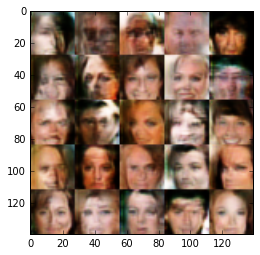

Epoch 1/1... Discriminator loss: 1.2320 Generator loss: 0.7518
Epoch 1/1... Discriminator loss: 1.3847 Generator loss: 0.7800
Epoch 1/1... Discriminator loss: 1.3504 Generator loss: 0.8358
Epoch 1/1... Discriminator loss: 1.1811 Generator loss: 0.9896
Epoch 1/1... Discriminator loss: 1.4454 Generator loss: 0.9390
Epoch 1/1... Discriminator loss: 1.2159 Generator loss: 1.1324
Epoch 1/1... Discriminator loss: 1.3729 Generator loss: 0.9611
Epoch 1/1... Discriminator loss: 1.2702 Generator loss: 0.9363
Epoch 1/1... Discriminator loss: 1.3106 Generator loss: 0.9775
Epoch 1/1... Discriminator loss: 1.4310 Generator loss: 0.8184


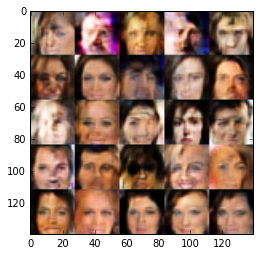

Epoch 1/1... Discriminator loss: 1.4209 Generator loss: 0.8396
Epoch 1/1... Discriminator loss: 1.4115 Generator loss: 0.7560
Epoch 1/1... Discriminator loss: 1.2476 Generator loss: 1.0483
Epoch 1/1... Discriminator loss: 1.1475 Generator loss: 0.9474
Epoch 1/1... Discriminator loss: 1.4855 Generator loss: 0.8264
Epoch 1/1... Discriminator loss: 1.2756 Generator loss: 0.8381
Epoch 1/1... Discriminator loss: 1.3498 Generator loss: 0.6672
Epoch 1/1... Discriminator loss: 1.1464 Generator loss: 0.7950
Epoch 1/1... Discriminator loss: 1.2681 Generator loss: 1.0252
Epoch 1/1... Discriminator loss: 1.3704 Generator loss: 1.1390


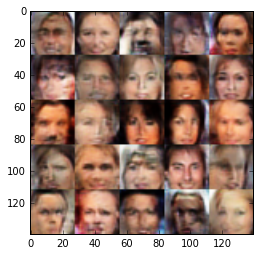

Epoch 1/1... Discriminator loss: 1.4481 Generator loss: 0.7895
Epoch 1/1... Discriminator loss: 1.4767 Generator loss: 0.9310
Epoch 1/1... Discriminator loss: 1.3482 Generator loss: 0.8654
Epoch 1/1... Discriminator loss: 1.2745 Generator loss: 0.7415
Epoch 1/1... Discriminator loss: 1.1834 Generator loss: 1.0144
Epoch 1/1... Discriminator loss: 1.4464 Generator loss: 0.8327
Epoch 1/1... Discriminator loss: 1.2649 Generator loss: 0.9288
Epoch 1/1... Discriminator loss: 1.3985 Generator loss: 0.9290
Epoch 1/1... Discriminator loss: 1.4210 Generator loss: 0.9105
Epoch 1/1... Discriminator loss: 1.3973 Generator loss: 0.8180


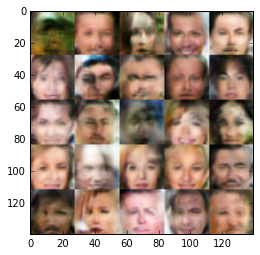

Epoch 1/1... Discriminator loss: 1.2215 Generator loss: 1.0999
Epoch 1/1... Discriminator loss: 1.3626 Generator loss: 0.8846
Epoch 1/1... Discriminator loss: 1.5483 Generator loss: 0.8742
Epoch 1/1... Discriminator loss: 1.3347 Generator loss: 0.8586
Epoch 1/1... Discriminator loss: 1.3704 Generator loss: 0.9041
Epoch 1/1... Discriminator loss: 1.3043 Generator loss: 0.7784
Epoch 1/1... Discriminator loss: 1.2779 Generator loss: 0.9126
Epoch 1/1... Discriminator loss: 1.2949 Generator loss: 0.8913
Epoch 1/1... Discriminator loss: 1.2296 Generator loss: 0.8683
Epoch 1/1... Discriminator loss: 1.3256 Generator loss: 0.9169


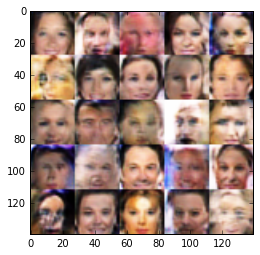

Epoch 1/1... Discriminator loss: 1.3932 Generator loss: 0.9101
Epoch 1/1... Discriminator loss: 1.2482 Generator loss: 0.8209
Epoch 1/1... Discriminator loss: 1.2845 Generator loss: 1.0035
Epoch 1/1... Discriminator loss: 1.4168 Generator loss: 0.8126
Epoch 1/1... Discriminator loss: 1.2360 Generator loss: 0.9306
Epoch 1/1... Discriminator loss: 1.1685 Generator loss: 1.0425
Epoch 1/1... Discriminator loss: 1.3412 Generator loss: 0.9567
Epoch 1/1... Discriminator loss: 1.4234 Generator loss: 0.7522
Epoch 1/1... Discriminator loss: 1.3009 Generator loss: 0.8892
Epoch 1/1... Discriminator loss: 1.1772 Generator loss: 1.0192


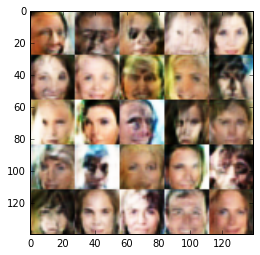

Epoch 1/1... Discriminator loss: 1.2083 Generator loss: 0.8716
Epoch 1/1... Discriminator loss: 1.3433 Generator loss: 0.9316
Epoch 1/1... Discriminator loss: 1.1946 Generator loss: 0.7207
Epoch 1/1... Discriminator loss: 1.2397 Generator loss: 1.0039
Epoch 1/1... Discriminator loss: 1.3077 Generator loss: 0.9836
Epoch 1/1... Discriminator loss: 1.2665 Generator loss: 1.0085
Epoch 1/1... Discriminator loss: 1.3839 Generator loss: 0.7283
Epoch 1/1... Discriminator loss: 1.4633 Generator loss: 0.7273
Epoch 1/1... Discriminator loss: 1.3713 Generator loss: 0.8339
Epoch 1/1... Discriminator loss: 1.3543 Generator loss: 0.8884


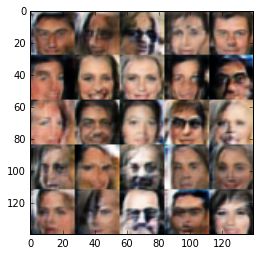

Epoch 1/1... Discriminator loss: 1.2970 Generator loss: 0.9349
Epoch 1/1... Discriminator loss: 1.3302 Generator loss: 0.7715
Epoch 1/1... Discriminator loss: 1.3212 Generator loss: 0.9777
Epoch 1/1... Discriminator loss: 1.3198 Generator loss: 0.9917
Epoch 1/1... Discriminator loss: 1.3072 Generator loss: 0.7802
Epoch 1/1... Discriminator loss: 1.2226 Generator loss: 0.8999
Epoch 1/1... Discriminator loss: 1.2643 Generator loss: 0.9227
Epoch 1/1... Discriminator loss: 1.2429 Generator loss: 0.8028
Epoch 1/1... Discriminator loss: 1.3745 Generator loss: 0.8486
Epoch 1/1... Discriminator loss: 1.2824 Generator loss: 0.8836


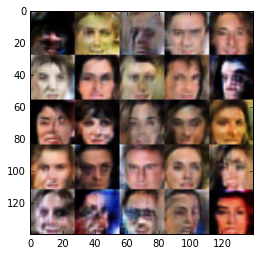

Epoch 1/1... Discriminator loss: 1.2081 Generator loss: 0.9814
Epoch 1/1... Discriminator loss: 1.2008 Generator loss: 0.7424
Epoch 1/1... Discriminator loss: 1.2122 Generator loss: 0.8475
Epoch 1/1... Discriminator loss: 1.2657 Generator loss: 0.8262
Epoch 1/1... Discriminator loss: 1.4235 Generator loss: 0.6021
Epoch 1/1... Discriminator loss: 1.2500 Generator loss: 0.9809
Epoch 1/1... Discriminator loss: 1.3316 Generator loss: 1.1699
Epoch 1/1... Discriminator loss: 1.3165 Generator loss: 0.9015
Epoch 1/1... Discriminator loss: 1.3972 Generator loss: 0.8715
Epoch 1/1... Discriminator loss: 1.3477 Generator loss: 0.9969


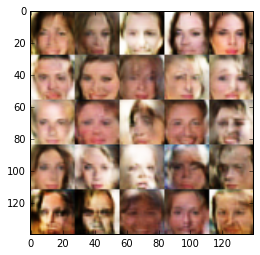

Epoch 1/1... Discriminator loss: 1.2858 Generator loss: 0.8991
Epoch 1/1... Discriminator loss: 1.3418 Generator loss: 0.8248
Epoch 1/1... Discriminator loss: 1.2572 Generator loss: 0.8690
Epoch 1/1... Discriminator loss: 1.2211 Generator loss: 0.9422
Epoch 1/1... Discriminator loss: 1.3133 Generator loss: 0.9485
Epoch 1/1... Discriminator loss: 1.2360 Generator loss: 0.9952
Epoch 1/1... Discriminator loss: 1.2709 Generator loss: 0.9849
Epoch 1/1... Discriminator loss: 1.3623 Generator loss: 0.7076
Epoch 1/1... Discriminator loss: 1.3795 Generator loss: 0.7224
Epoch 1/1... Discriminator loss: 1.2483 Generator loss: 0.9230


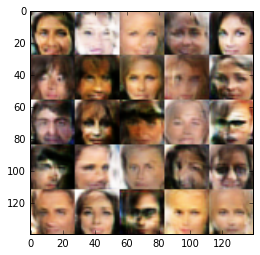

Epoch 1/1... Discriminator loss: 1.3400 Generator loss: 0.9015
Epoch 1/1... Discriminator loss: 1.2973 Generator loss: 0.9847
Epoch 1/1... Discriminator loss: 1.3065 Generator loss: 0.8308
Epoch 1/1... Discriminator loss: 1.4703 Generator loss: 0.8866
Epoch 1/1... Discriminator loss: 1.3087 Generator loss: 0.8715
Epoch 1/1... Discriminator loss: 1.3795 Generator loss: 0.8368
Epoch 1/1... Discriminator loss: 1.3129 Generator loss: 0.9618
Epoch 1/1... Discriminator loss: 1.3769 Generator loss: 0.8426
Epoch 1/1... Discriminator loss: 1.2473 Generator loss: 0.8513
Epoch 1/1... Discriminator loss: 1.3462 Generator loss: 0.9026


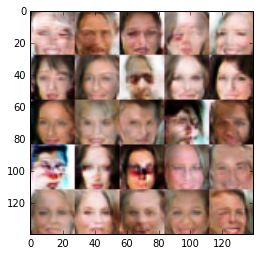

Epoch 1/1... Discriminator loss: 1.3988 Generator loss: 0.6836
Epoch 1/1... Discriminator loss: 1.3514 Generator loss: 0.9047
Epoch 1/1... Discriminator loss: 1.3768 Generator loss: 0.9610
Epoch 1/1... Discriminator loss: 1.3564 Generator loss: 0.7753
Epoch 1/1... Discriminator loss: 1.3860 Generator loss: 0.8514
Epoch 1/1... Discriminator loss: 1.2199 Generator loss: 1.0485
Epoch 1/1... Discriminator loss: 1.2357 Generator loss: 0.9144
Epoch 1/1... Discriminator loss: 1.1955 Generator loss: 0.8762
Epoch 1/1... Discriminator loss: 1.3575 Generator loss: 0.8832
Epoch 1/1... Discriminator loss: 1.3972 Generator loss: 0.9938


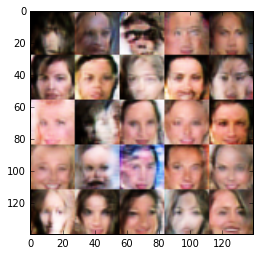

Epoch 1/1... Discriminator loss: 1.2939 Generator loss: 0.7247
Epoch 1/1... Discriminator loss: 1.2412 Generator loss: 0.8617
Epoch 1/1... Discriminator loss: 1.3340 Generator loss: 1.0109
Epoch 1/1... Discriminator loss: 1.2277 Generator loss: 0.9462
Epoch 1/1... Discriminator loss: 1.0894 Generator loss: 1.0217
Epoch 1/1... Discriminator loss: 1.2999 Generator loss: 1.0050
Epoch 1/1... Discriminator loss: 1.4516 Generator loss: 0.8454
Epoch 1/1... Discriminator loss: 1.1920 Generator loss: 1.1354
Epoch 1/1... Discriminator loss: 1.2389 Generator loss: 1.0245
Epoch 1/1... Discriminator loss: 1.2652 Generator loss: 0.8960


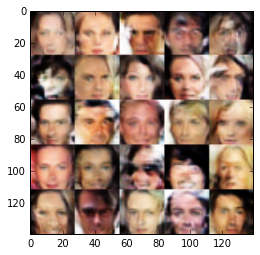

Epoch 1/1... Discriminator loss: 1.3488 Generator loss: 0.6303
Epoch 1/1... Discriminator loss: 1.3722 Generator loss: 0.7656
Epoch 1/1... Discriminator loss: 1.3772 Generator loss: 0.7611
Epoch 1/1... Discriminator loss: 1.3026 Generator loss: 0.8795
Epoch 1/1... Discriminator loss: 1.5409 Generator loss: 0.8328
Epoch 1/1... Discriminator loss: 1.4220 Generator loss: 0.7838
Epoch 1/1... Discriminator loss: 1.4088 Generator loss: 0.8365
Epoch 1/1... Discriminator loss: 1.3055 Generator loss: 1.0314
Epoch 1/1... Discriminator loss: 1.3078 Generator loss: 0.7254
Epoch 1/1... Discriminator loss: 1.2507 Generator loss: 0.8927


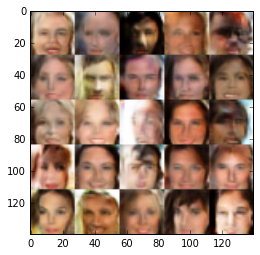

Epoch 1/1... Discriminator loss: 1.3035 Generator loss: 0.7850
Epoch 1/1... Discriminator loss: 1.2649 Generator loss: 1.0108
Epoch 1/1... Discriminator loss: 1.4745 Generator loss: 0.7840
Epoch 1/1... Discriminator loss: 1.2679 Generator loss: 0.8224
Epoch 1/1... Discriminator loss: 1.3481 Generator loss: 0.8490
Epoch 1/1... Discriminator loss: 1.3472 Generator loss: 0.9275
Epoch 1/1... Discriminator loss: 1.2224 Generator loss: 1.1018
Epoch 1/1... Discriminator loss: 1.2920 Generator loss: 0.8289
Epoch 1/1... Discriminator loss: 1.3823 Generator loss: 1.0000
Epoch 1/1... Discriminator loss: 1.4041 Generator loss: 0.9316


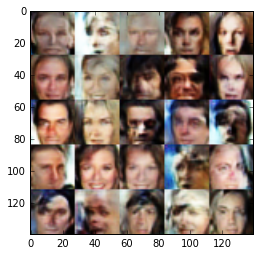

Epoch 1/1... Discriminator loss: 1.3217 Generator loss: 0.8330
Epoch 1/1... Discriminator loss: 1.1752 Generator loss: 1.0810
Epoch 1/1... Discriminator loss: 1.4600 Generator loss: 0.8250
Epoch 1/1... Discriminator loss: 1.4253 Generator loss: 0.9428
Epoch 1/1... Discriminator loss: 1.3028 Generator loss: 0.9646
Epoch 1/1... Discriminator loss: 1.3130 Generator loss: 0.9003
Epoch 1/1... Discriminator loss: 1.2875 Generator loss: 1.0115
Epoch 1/1... Discriminator loss: 1.3864 Generator loss: 0.9658
Epoch 1/1... Discriminator loss: 1.2534 Generator loss: 0.9579
Epoch 1/1... Discriminator loss: 1.3233 Generator loss: 0.8502


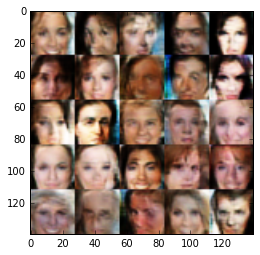

Epoch 1/1... Discriminator loss: 1.3783 Generator loss: 0.9236
Epoch 1/1... Discriminator loss: 1.4236 Generator loss: 0.8084
Epoch 1/1... Discriminator loss: 1.3196 Generator loss: 0.9048
Epoch 1/1... Discriminator loss: 1.3576 Generator loss: 0.8831
Epoch 1/1... Discriminator loss: 1.3779 Generator loss: 0.8280
Epoch 1/1... Discriminator loss: 1.3133 Generator loss: 1.0108
Epoch 1/1... Discriminator loss: 1.2049 Generator loss: 0.7793
Epoch 1/1... Discriminator loss: 1.3389 Generator loss: 0.9271
Epoch 1/1... Discriminator loss: 1.2590 Generator loss: 0.8048
Epoch 1/1... Discriminator loss: 1.5151 Generator loss: 0.7136


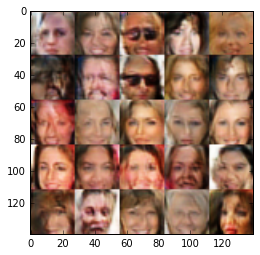

Epoch 1/1... Discriminator loss: 1.2994 Generator loss: 0.8043
Epoch 1/1... Discriminator loss: 1.4465 Generator loss: 0.6807
Epoch 1/1... Discriminator loss: 1.3946 Generator loss: 0.8090
Epoch 1/1... Discriminator loss: 1.3189 Generator loss: 0.8373
Epoch 1/1... Discriminator loss: 1.2723 Generator loss: 0.8611
Epoch 1/1... Discriminator loss: 1.1524 Generator loss: 0.9189
Epoch 1/1... Discriminator loss: 1.2421 Generator loss: 0.8021
Epoch 1/1... Discriminator loss: 1.2418 Generator loss: 1.0300
Epoch 1/1... Discriminator loss: 1.3935 Generator loss: 0.9757
Epoch 1/1... Discriminator loss: 1.3008 Generator loss: 0.7854


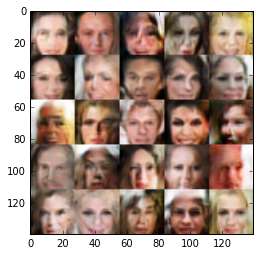

Epoch 1/1... Discriminator loss: 1.1847 Generator loss: 0.9316
Epoch 1/1... Discriminator loss: 1.4972 Generator loss: 0.9927
Epoch 1/1... Discriminator loss: 1.1922 Generator loss: 0.8740
Epoch 1/1... Discriminator loss: 1.2728 Generator loss: 1.0197
Epoch 1/1... Discriminator loss: 1.3389 Generator loss: 0.9215
Epoch 1/1... Discriminator loss: 1.2492 Generator loss: 0.9444
Epoch 1/1... Discriminator loss: 1.2975 Generator loss: 0.8299
Epoch 1/1... Discriminator loss: 1.3737 Generator loss: 0.9055
Epoch 1/1... Discriminator loss: 1.3169 Generator loss: 0.8084
Epoch 1/1... Discriminator loss: 1.4239 Generator loss: 0.8780


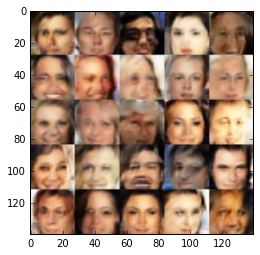

Epoch 1/1... Discriminator loss: 1.3094 Generator loss: 0.8949
Epoch 1/1... Discriminator loss: 1.2656 Generator loss: 0.8948
Epoch 1/1... Discriminator loss: 1.3952 Generator loss: 0.8607
Epoch 1/1... Discriminator loss: 1.4218 Generator loss: 0.7589
Epoch 1/1... Discriminator loss: 1.3560 Generator loss: 0.7609
Epoch 1/1... Discriminator loss: 1.3333 Generator loss: 0.9712
Epoch 1/1... Discriminator loss: 1.1928 Generator loss: 0.9571
Epoch 1/1... Discriminator loss: 1.3306 Generator loss: 0.9105
Epoch 1/1... Discriminator loss: 1.4794 Generator loss: 0.8413
Epoch 1/1... Discriminator loss: 1.2381 Generator loss: 0.9385


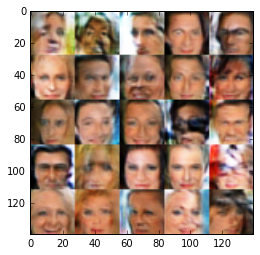

Epoch 1/1... Discriminator loss: 1.2932 Generator loss: 1.0151
Epoch 1/1... Discriminator loss: 1.3849 Generator loss: 0.9720
Epoch 1/1... Discriminator loss: 1.3033 Generator loss: 0.9407
Epoch 1/1... Discriminator loss: 1.3124 Generator loss: 0.8899
Epoch 1/1... Discriminator loss: 1.3051 Generator loss: 0.8061
Epoch 1/1... Discriminator loss: 1.3097 Generator loss: 0.9612
Epoch 1/1... Discriminator loss: 1.4006 Generator loss: 0.8994
Epoch 1/1... Discriminator loss: 1.2541 Generator loss: 0.8709
Epoch 1/1... Discriminator loss: 1.4572 Generator loss: 0.7693
Epoch 1/1... Discriminator loss: 1.3612 Generator loss: 0.8268


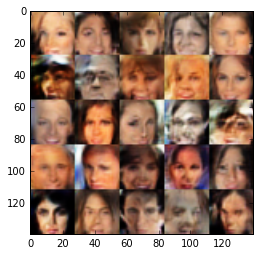

Epoch 1/1... Discriminator loss: 1.3413 Generator loss: 0.8663
Epoch 1/1... Discriminator loss: 1.3301 Generator loss: 0.8837
Epoch 1/1... Discriminator loss: 1.2284 Generator loss: 0.9078
Epoch 1/1... Discriminator loss: 1.2451 Generator loss: 0.9853
Epoch 1/1... Discriminator loss: 1.2528 Generator loss: 0.8963
Epoch 1/1... Discriminator loss: 1.3239 Generator loss: 0.7641
Epoch 1/1... Discriminator loss: 1.3120 Generator loss: 0.8516
Epoch 1/1... Discriminator loss: 1.3964 Generator loss: 0.8123
Epoch 1/1... Discriminator loss: 1.3135 Generator loss: 0.7910
Epoch 1/1... Discriminator loss: 1.4944 Generator loss: 0.7949


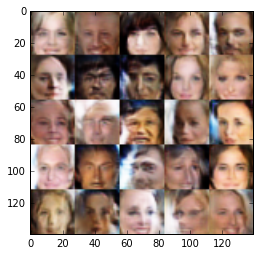

Epoch 1/1... Discriminator loss: 1.3590 Generator loss: 0.8824
Epoch 1/1... Discriminator loss: 1.2366 Generator loss: 1.3080
Epoch 1/1... Discriminator loss: 1.3936 Generator loss: 0.7451
Epoch 1/1... Discriminator loss: 1.3895 Generator loss: 0.7689
Epoch 1/1... Discriminator loss: 1.4049 Generator loss: 0.7882
Epoch 1/1... Discriminator loss: 1.3765 Generator loss: 0.8074
Epoch 1/1... Discriminator loss: 1.3951 Generator loss: 0.9648
Epoch 1/1... Discriminator loss: 1.2945 Generator loss: 0.8876
Epoch 1/1... Discriminator loss: 1.3741 Generator loss: 0.7080
Epoch 1/1... Discriminator loss: 1.2194 Generator loss: 0.8524


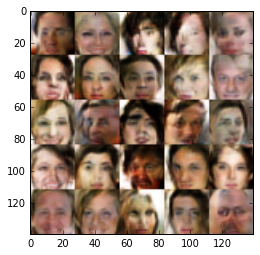

Epoch 1/1... Discriminator loss: 1.3255 Generator loss: 1.0274
Epoch 1/1... Discriminator loss: 1.4221 Generator loss: 0.8416
Epoch 1/1... Discriminator loss: 1.3562 Generator loss: 0.8179
Epoch 1/1... Discriminator loss: 1.3146 Generator loss: 1.0098
Epoch 1/1... Discriminator loss: 1.2580 Generator loss: 1.0018
Epoch 1/1... Discriminator loss: 1.3546 Generator loss: 0.8020
Epoch 1/1... Discriminator loss: 1.3852 Generator loss: 0.8572
Epoch 1/1... Discriminator loss: 1.2928 Generator loss: 0.9055
Epoch 1/1... Discriminator loss: 1.3942 Generator loss: 0.9315
Epoch 1/1... Discriminator loss: 1.2740 Generator loss: 0.8990


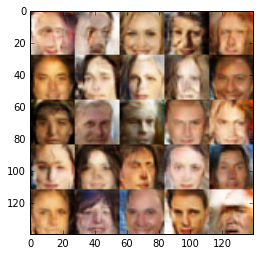

Epoch 1/1... Discriminator loss: 1.4238 Generator loss: 0.8118
Epoch 1/1... Discriminator loss: 1.3160 Generator loss: 0.8877
Epoch 1/1... Discriminator loss: 1.3120 Generator loss: 0.9650
Epoch 1/1... Discriminator loss: 1.3581 Generator loss: 1.0174
Epoch 1/1... Discriminator loss: 1.5232 Generator loss: 0.6990
Epoch 1/1... Discriminator loss: 1.3370 Generator loss: 1.0035
Epoch 1/1... Discriminator loss: 1.1786 Generator loss: 0.9489
Epoch 1/1... Discriminator loss: 1.2257 Generator loss: 0.8647
Epoch 1/1... Discriminator loss: 1.3770 Generator loss: 0.8505
Epoch 1/1... Discriminator loss: 1.3596 Generator loss: 0.8367


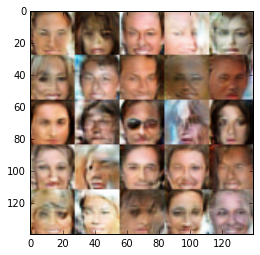

Epoch 1/1... Discriminator loss: 1.2397 Generator loss: 0.9203
Epoch 1/1... Discriminator loss: 1.3572 Generator loss: 1.0814
Epoch 1/1... Discriminator loss: 1.3488 Generator loss: 0.9732
Epoch 1/1... Discriminator loss: 1.2843 Generator loss: 0.9710
Epoch 1/1... Discriminator loss: 1.3567 Generator loss: 0.8599
Epoch 1/1... Discriminator loss: 1.2305 Generator loss: 0.9809
Epoch 1/1... Discriminator loss: 1.3183 Generator loss: 0.9431
Epoch 1/1... Discriminator loss: 1.2910 Generator loss: 0.9330
Epoch 1/1... Discriminator loss: 1.3664 Generator loss: 0.8133
Epoch 1/1... Discriminator loss: 1.3375 Generator loss: 0.9162


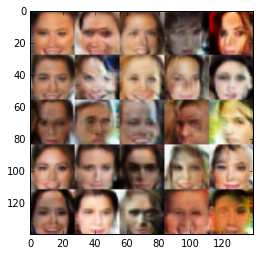

Epoch 1/1... Discriminator loss: 1.2806 Generator loss: 0.8953
Epoch 1/1... Discriminator loss: 1.2555 Generator loss: 0.9796
Epoch 1/1... Discriminator loss: 1.4632 Generator loss: 0.7102
Epoch 1/1... Discriminator loss: 1.4611 Generator loss: 0.9280
Epoch 1/1... Discriminator loss: 1.4505 Generator loss: 0.8680
Epoch 1/1... Discriminator loss: 1.3009 Generator loss: 0.8599
Epoch 1/1... Discriminator loss: 1.3697 Generator loss: 0.6968
Epoch 1/1... Discriminator loss: 1.4407 Generator loss: 0.9180
Epoch 1/1... Discriminator loss: 1.3629 Generator loss: 0.8440
Epoch 1/1... Discriminator loss: 1.2049 Generator loss: 0.9580


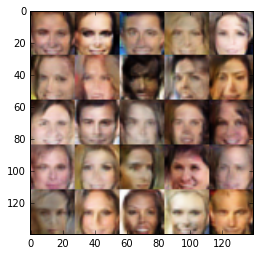

Epoch 1/1... Discriminator loss: 1.4193 Generator loss: 0.7657
Epoch 1/1... Discriminator loss: 1.2977 Generator loss: 1.0047
Epoch 1/1... Discriminator loss: 1.4064 Generator loss: 0.9455
Epoch 1/1... Discriminator loss: 1.2875 Generator loss: 0.8384
Epoch 1/1... Discriminator loss: 1.2141 Generator loss: 0.8383
Epoch 1/1... Discriminator loss: 1.2720 Generator loss: 0.8659
Epoch 1/1... Discriminator loss: 1.3033 Generator loss: 0.9631
Epoch 1/1... Discriminator loss: 1.3486 Generator loss: 0.9401
Epoch 1/1... Discriminator loss: 1.3124 Generator loss: 0.8705
Epoch 1/1... Discriminator loss: 1.3875 Generator loss: 0.7312


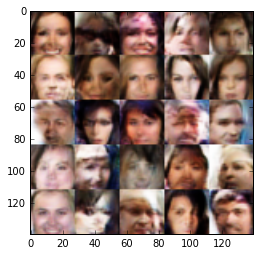

Epoch 1/1... Discriminator loss: 1.3246 Generator loss: 0.8169
Epoch 1/1... Discriminator loss: 1.4421 Generator loss: 0.7892
Epoch 1/1... Discriminator loss: 1.2740 Generator loss: 0.8753
Epoch 1/1... Discriminator loss: 1.4148 Generator loss: 0.9167
Epoch 1/1... Discriminator loss: 1.3309 Generator loss: 0.8296
Epoch 1/1... Discriminator loss: 1.2648 Generator loss: 0.7825
Epoch 1/1... Discriminator loss: 1.3425 Generator loss: 0.8513
Epoch 1/1... Discriminator loss: 1.2657 Generator loss: 0.9244
Epoch 1/1... Discriminator loss: 1.3243 Generator loss: 0.9828
Epoch 1/1... Discriminator loss: 1.3305 Generator loss: 0.8484


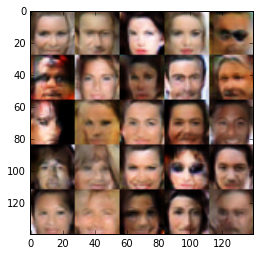

Epoch 1/1... Discriminator loss: 1.2697 Generator loss: 0.8228
Epoch 1/1... Discriminator loss: 1.4459 Generator loss: 0.9276
Epoch 1/1... Discriminator loss: 1.3660 Generator loss: 0.9020
Epoch 1/1... Discriminator loss: 1.3231 Generator loss: 0.7825
Epoch 1/1... Discriminator loss: 1.3006 Generator loss: 0.8295
Epoch 1/1... Discriminator loss: 1.3073 Generator loss: 1.0144
Epoch 1/1... Discriminator loss: 1.2404 Generator loss: 0.9491
Epoch 1/1... Discriminator loss: 1.2835 Generator loss: 0.9600
Epoch 1/1... Discriminator loss: 1.3623 Generator loss: 0.8149
Epoch 1/1... Discriminator loss: 1.3101 Generator loss: 1.0210


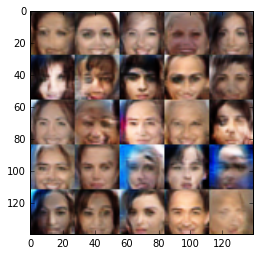

Epoch 1/1... Discriminator loss: 1.3640 Generator loss: 0.8094
Epoch 1/1... Discriminator loss: 1.4124 Generator loss: 0.8578
Epoch 1/1... Discriminator loss: 1.4860 Generator loss: 0.8215
Epoch 1/1... Discriminator loss: 1.2960 Generator loss: 0.8913
Epoch 1/1... Discriminator loss: 1.3967 Generator loss: 0.8067
Epoch 1/1... Discriminator loss: 1.2942 Generator loss: 0.9554
Epoch 1/1... Discriminator loss: 1.3298 Generator loss: 1.0897
Epoch 1/1... Discriminator loss: 1.3598 Generator loss: 0.9155
Epoch 1/1... Discriminator loss: 1.3637 Generator loss: 0.9162
Epoch 1/1... Discriminator loss: 1.3480 Generator loss: 1.0701


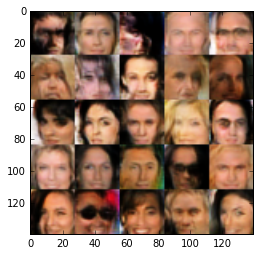

Epoch 1/1... Discriminator loss: 1.3878 Generator loss: 0.7991
Epoch 1/1... Discriminator loss: 1.4462 Generator loss: 0.8356
Epoch 1/1... Discriminator loss: 1.3061 Generator loss: 0.7721
Epoch 1/1... Discriminator loss: 1.3438 Generator loss: 0.8476
Epoch 1/1... Discriminator loss: 1.3659 Generator loss: 0.8152
Epoch 1/1... Discriminator loss: 1.4266 Generator loss: 0.8642
Epoch 1/1... Discriminator loss: 1.2723 Generator loss: 0.8842
Epoch 1/1... Discriminator loss: 1.3532 Generator loss: 0.9560
Epoch 1/1... Discriminator loss: 1.5070 Generator loss: 0.9068
Epoch 1/1... Discriminator loss: 1.3776 Generator loss: 0.8776


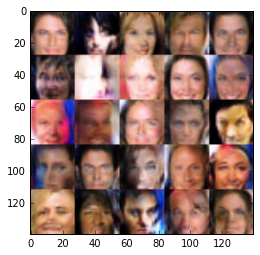

Epoch 1/1... Discriminator loss: 1.3047 Generator loss: 0.8752
Epoch 1/1... Discriminator loss: 1.5429 Generator loss: 0.7173
Epoch 1/1... Discriminator loss: 1.2460 Generator loss: 0.8798
Epoch 1/1... Discriminator loss: 1.2598 Generator loss: 0.9184
Epoch 1/1... Discriminator loss: 1.2454 Generator loss: 0.7869
Epoch 1/1... Discriminator loss: 1.3622 Generator loss: 0.8442
Epoch 1/1... Discriminator loss: 1.3514 Generator loss: 0.9020
Epoch 1/1... Discriminator loss: 1.2991 Generator loss: 0.8781
Epoch 1/1... Discriminator loss: 1.3317 Generator loss: 0.6772
Epoch 1/1... Discriminator loss: 1.3003 Generator loss: 0.9099


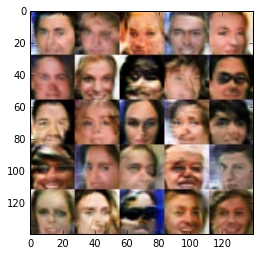

Epoch 1/1... Discriminator loss: 1.3975 Generator loss: 0.9914
Epoch 1/1... Discriminator loss: 1.3182 Generator loss: 0.9807
Epoch 1/1... Discriminator loss: 1.4296 Generator loss: 0.7680
Epoch 1/1... Discriminator loss: 1.2722 Generator loss: 1.1486
Epoch 1/1... Discriminator loss: 1.4352 Generator loss: 0.8063
Epoch 1/1... Discriminator loss: 1.3585 Generator loss: 0.9121
Epoch 1/1... Discriminator loss: 1.3338 Generator loss: 0.8359
Epoch 1/1... Discriminator loss: 1.4038 Generator loss: 0.7962
Epoch 1/1... Discriminator loss: 1.3679 Generator loss: 0.6810
Epoch 1/1... Discriminator loss: 1.2745 Generator loss: 0.8728


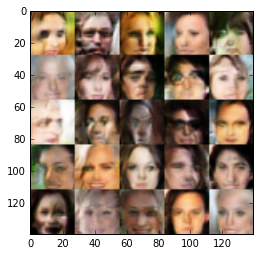

Epoch 1/1... Discriminator loss: 1.3472 Generator loss: 0.9464
Epoch 1/1... Discriminator loss: 1.4326 Generator loss: 0.8306
Epoch 1/1... Discriminator loss: 1.3935 Generator loss: 0.8666


In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0008
beta1 = 0.5


epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)